In [1]:
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# from mplfinance.original_flavor import candlestick2_ohlc
import matplotlib.dates as mdates
import statsmodels.api as sm
import mplfinance as mpf

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import MinMaxScaler
import keras
from statsmodels.tsa.api import var
from statsmodels.tools.eval_measures import rmse

import warnings

# Suppress all warnings temporarily
warnings.filterwarnings("ignore")

In [2]:
# List of file names
file_names = [
    "data/AAPL_2023-05-01_2023-09-30.csv",
    "data/AMZN_2023-05-01_2023-09-30.csv",
    "data/GOOGL_2023-05-01_2023-09-30.csv",
    "data/IBM_2023-05-01_2023-09-30.csv",
    "data/JPM_2023-05-01_2023-09-30.csv",
    "data/META_2023-05-01_2023-09-30.csv",
    "data/MSFT_2023-05-01_2023-09-30.csv",
    "data/NFLX_2023-05-01_2023-09-30.csv",
    "data/NVDA_2023-05-01_2023-09-30.csv",
    "data/TSLA_2023-05-01_2023-09-30.csv",
    "data/V_2023-05-01_2023-09-30.csv"
]

# Create an empty list to store the DataFrames
dfs = []

# Loop through the file names and read each CSV file into a DataFrame
for file_name in file_names:
    df = pd.read_csv(file_name)
    
    # Extract the symbol from the file name (assuming the format "symbol_start_date_end_date.csv")
    symbol = file_name.split("_")[0].split("/")[-1]
    
    # Add the "symbol" column
    df["symbol"] = symbol
    
    # Append the DataFrame to the list
    dfs.append(df)

# Concatenate all the DataFrames in the list into one DataFrame
df = pd.concat(dfs, ignore_index=True)
df.shape

(1089, 7)

In [3]:
df.isna().sum()

timestamp    0
open         0
high         0
low          0
close        0
volume       0
symbol       0
dtype: int64

In [4]:
df.sample(20)

,timestamp,open,high,low,close,volume,symbol
878,2023-05-26,378.90,391.7000,375.5000,389.46,71439676,NVDA
461,2023-06-28,139.16,139.2100,137.9600,138.59,7558644,JPM
268,2023-06-21,122.40,122.6600,120.1000,120.55,30306336,GOOGL
204,2023-09-21,131.44,132.2300,130.0700,130.44,31503910,GOOGL
875,2023-06-01,384.89,400.5000,383.4000,397.70,63587295,NVDA
762,2023-06-22,422.93,424.7100,418.6801,422.48,4872246,NFLX
970,2023-06-07,228.00,230.8296,223.2000,224.57,185710777,TSLA
685,2023-05-19,316.74,318.7500,316.3700,318.34,27546701,MSFT
849,2023-07-11,424.81,427.5800,420.6700,424.05,29824406,NVDA
347,2023-07-20,137.19,140.3200,136.5600,138.38,10896330,IBM


In [5]:
df.describe()

,open,high,low,close,volume
count,1089.000000,1089.000000,1089.000000,1089.000000,1.089000e+03
mean,241.120829,244.163696,238.192616,241.166887,3.636663e+07
std,107.322516,109.120090,105.319074,107.147602,3.774068e+07
min,107.970000,110.670000,107.930000,110.190000,1.477149e+06
25%,140.620000,142.090000,139.610000,140.690000,7.118889e+06
50%,229.270000,232.134300,227.420000,229.650000,2.398971e+07
75%,318.000000,322.410000,315.000000,318.340000,5.001735e+07
max,502.160000,502.660000,489.580000,493.550000,2.117971e+08


In [6]:
data = df.copy()

In [7]:
num_cols = ['open', 'high', 'low', 'close', 'volume']
mean_values = df[num_cols].mean()
std_dev_values = df[num_cols].std()


# Define a threshold for identifying outliers (using Z-score)
z_threshold = 0.2

outlier_value = ((df[num_cols] - mean_values).abs() / (std_dev_values) > z_threshold)

# Identify rows with at least one outlier
outliers = df[outlier_value.any(axis=1)]

# Print the rows with outliers
print("Rows with outliers:")
print(outliers)

Rows with outliers:
       timestamp    open      high      low   close    volume symbol
0     2023-09-29  172.02  173.0700  170.341  171.21  51861083   AAPL
1     2023-09-28  169.34  172.0300  167.620  170.69  56294419   AAPL
2     2023-09-27  172.62  173.0400  169.050  170.43  66921808   AAPL
3     2023-09-26  174.82  175.2000  171.660  171.96  64588945   AAPL
4     2023-09-25  174.20  176.9700  174.150  176.08  46172740   AAPL
...          ...     ...       ...      ...     ...       ...    ...
1084  2023-05-16  232.56  233.0988  229.630  230.47   4289809      V
1085  2023-05-15  231.19  232.8300  230.550  232.81   2843284      V
1086  2023-05-12  232.00  232.7300  229.820  231.38   3432730      V
1087  2023-05-11  230.75  231.5200  228.270  231.01   3818035      V
1088  2023-05-10  234.30  234.8100  228.900  231.27   5245220      V

[1089 rows x 7 columns]


In [8]:
def detect_outliers(df, num_cols, iqr_multiplier=1.5):
  """
  Detects outliers in multiple columns of a DataFrame using the interquartile range (IQR) method.

  Args:
    df: A Pandas DataFrame.
    num_cols: A list of column names to detect outliers in.
    iqr_multiplier: A multiplier to use when calculating the IQR threshold.

  Returns:
    A list of outliers, where each outlier is a tuple of (row_index, column_name, value).
  """

  outliers = []
  for num_col in num_cols:
    # Calculate the IQR.
    q1 = df[num_col].quantile(0.25)
    q3 = df[num_col].quantile(0.75)
    iqr = q3 - q1

    # Calculate the IQR threshold.
    iqr_threshold = iqr_multiplier * iqr

    # Identify outliers.
    for i in range(len(df)):
      value = df[num_col].iloc[i]
      if value < q1 - iqr_threshold or value > q3 + iqr_threshold:
        outliers.append((i, num_col, value))

  return outliers

# Example usage:

# Detect outliers using the IQR method with a multiplier of 1.5.
outliers = detect_outliers(df, ["open", "high", "low", "close", "volume"], iqr_multiplier=1.5)

# Print the outliers.
for outlier in outliers:
  print(outlier)

(39, 'volume', 115956841)
(81, 'volume', 121946497)
(138, 'volume', 153128470)
(148, 'volume', 133307294)
(817, 'volume', 115604409)
(879, 'volume', 154391067)
(891, 'volume', 128522729)
(892, 'volume', 117058870)
(893, 'volume', 136597184)
(896, 'volume', 127524083)
(897, 'volume', 119951516)
(898, 'volume', 122514643)
(901, 'volume', 133692313)
(904, 'volume', 135999866)
(905, 'volume', 174667852)
(906, 'volume', 118559635)
(907, 'volume', 115312886)
(908, 'volume', 116959759)
(909, 'volume', 129469565)
(910, 'volume', 132541640)
(912, 'volume', 121988437)
(913, 'volume', 134047603)
(918, 'volume', 130597886)
(919, 'volume', 135702671)
(920, 'volume', 136276584)
(921, 'volume', 120718417)
(939, 'volume', 137005037)
(940, 'volume', 161796073)
(941, 'volume', 175158273)
(942, 'volume', 142355353)
(944, 'volume', 131569593)
(945, 'volume', 120062369)
(949, 'volume', 119425405)
(951, 'volume', 120707419)
(952, 'volume', 131530862)
(953, 'volume', 119685891)
(955, 'volume', 131283360)
(95

We have about 66 rows of outliers. So what's the solution?

In [9]:
df['timestamp'] = pd.to_datetime(df['timestamp'])
df_copy = df.copy()  # Create a 2nd copy of the DataFrame
df_copy.set_index('timestamp', inplace=True)

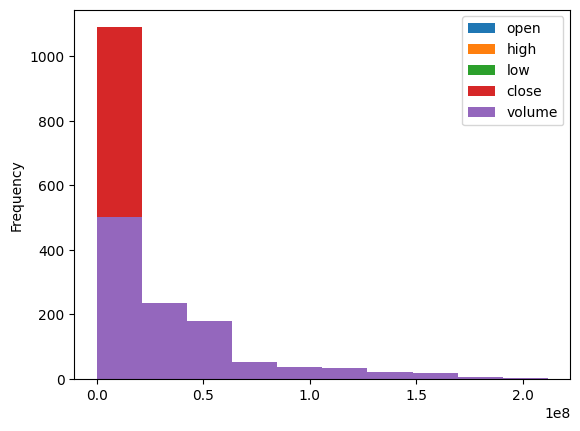

In [10]:
df.plot(kind='hist');

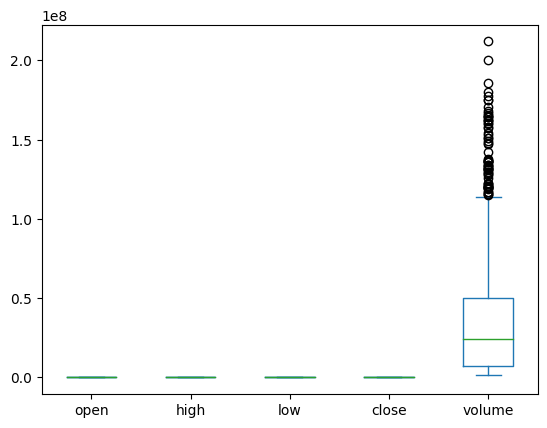

In [11]:
df.plot(kind='box');

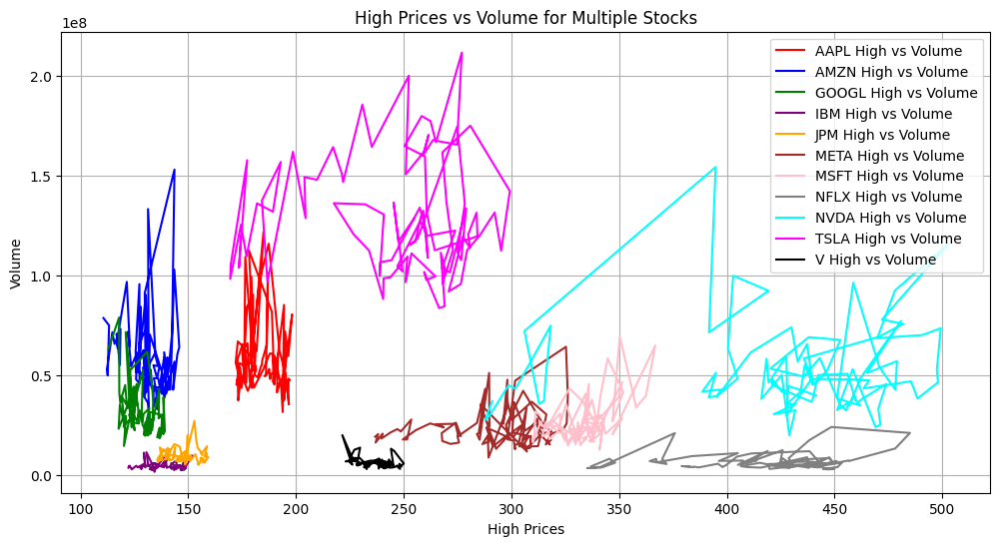

In [12]:
# Create a list of unique stock symbols in the DataFrame
stock_symbols = df['symbol'].unique()

# Create a color map for each stock symbol (you can customize this)
colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta', 'black']

# Create the plot with different colors for each stock
plt.figure(figsize=(12, 6))  # Set the figure size

for i, symbol in enumerate(stock_symbols):
    stock_df = df[df['symbol'] == symbol]
    plt.plot(stock_df['high'], stock_df['volume'], label=f'{symbol} High vs Volume', color=colors[i])

# You can customize the plot further:
plt.title('High Prices vs Volume for Multiple Stocks')
plt.xlabel('High Prices')
plt.ylabel('Volume')
plt.legend()
plt.grid(True)

# Show the plot
plt.show()

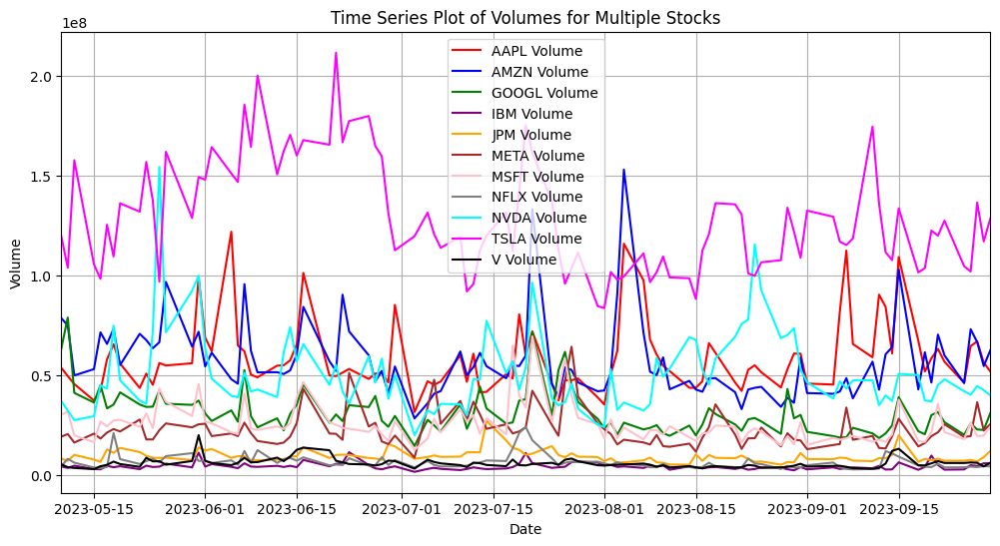

In [13]:
# Create a list of unique stock symbols in the DataFrame
stock_symbols = df['symbol'].unique()

# Create a color map for each stock symbol (you can customize this)
colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta', 'black']

# Create the plot with different colors for each stock
plt.figure(figsize=(12, 6))  # Set the figure size

for i, symbol in enumerate(stock_symbols):
    stock_df = df[df['symbol'] == symbol]
    plt.plot(stock_df['timestamp'], stock_df['volume'], label=f'{symbol} Volume', color=colors[i])

# You can customize the plot further:
plt.title('Time Series Plot of Volumes for Multiple Stocks')
plt.xlabel('Date')
plt.ylabel('Volume')
plt.legend()
plt.grid(True)

# Set the x-axis limits to show the full time range
plt.xlim(df['timestamp'].min(), df['timestamp'].max())

# Show the plot
plt.show()

The plot typically indicates that there has been a relatively higher level of trading activity in TSLA shares during the specified time period compared to the other stocks between May and September 2023

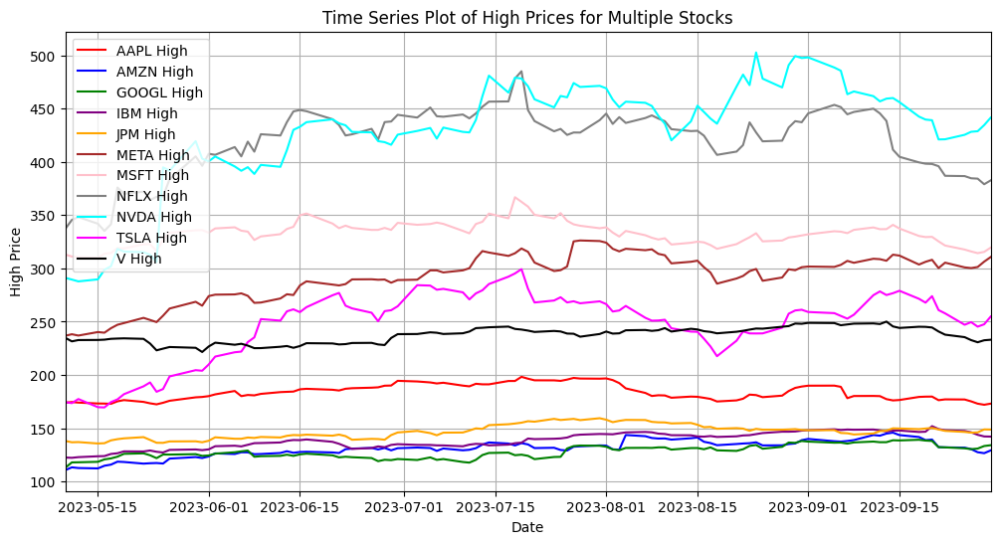

In [14]:
# Create a list of unique stock symbols in the DataFrame
stock_symbols = df['symbol'].unique()

# Create a color map for each stock symbol (you can customize this)
colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta', 'black']

# Create the plot with different colors for each stock
plt.figure(figsize=(12, 6))  # Set the figure size

for i, symbol in enumerate(stock_symbols):
    stock_df = df[df['symbol'] == symbol]
    plt.plot(stock_df['timestamp'], stock_df['high'], label=f'{symbol} High', color=colors[i])

# You can customize the plot further:
plt.title('Time Series Plot of High Prices for Multiple Stocks')
plt.xlabel('Date')
plt.ylabel('High Price')
plt.legend()
plt.grid(True)

# Set the x-axis limits to show the full time range
plt.xlim(df['timestamp'].min(), df['timestamp'].max())

# Show the plot
plt.show()


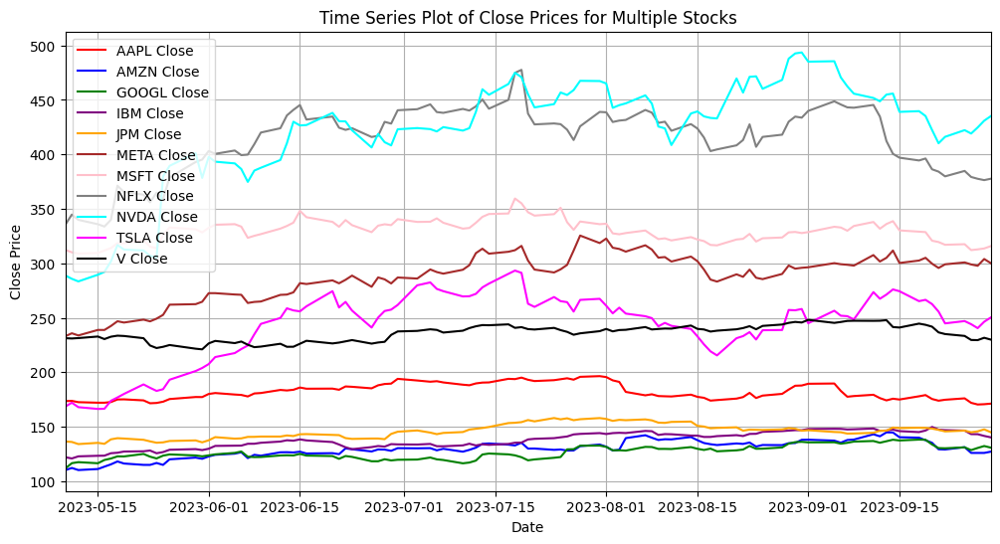

In [15]:
# Create a list of unique stock symbols in the DataFrame
stock_symbols = df['symbol'].unique()

# Create a color map for each stock symbol (you can customize this)
colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta', 'black']

# Create the plot with different colors for each stock
plt.figure(figsize=(12, 6))  # Set the figure size

for i, symbol in enumerate(stock_symbols):
    stock_df = df[df['symbol'] == symbol]
    plt.plot(stock_df['timestamp'], stock_df['close'], label=f'{symbol} Close', color=colors[i])

# You can customize the plot further:
plt.title('Time Series Plot of Close Prices for Multiple Stocks')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.grid(True)

# Set the x-axis limits to show the full time range
plt.xlim(df['timestamp'].min(), df['timestamp'].max())

# Show the plot
plt.show()

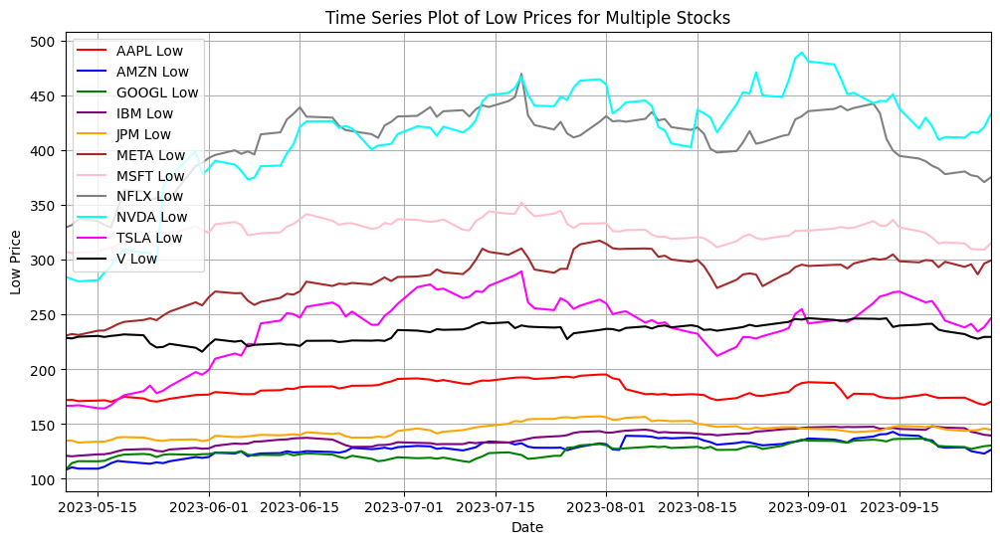

In [16]:
# Create a list of unique stock symbols in the DataFrame
stock_symbols = df['symbol'].unique()

# Create a color map for each stock symbol (you can customize this)
colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta', 'black']

# Create the plot with different colors for each stock
plt.figure(figsize=(12, 6))  # Set the figure size

for i, symbol in enumerate(stock_symbols):
    stock_df = df[df['symbol'] == symbol]
    plt.plot(stock_df['timestamp'], stock_df['low'], label=f'{symbol} Low', color=colors[i])

# You can customize the plot further:
plt.title('Time Series Plot of Low Prices for Multiple Stocks')
plt.xlabel('Date')
plt.ylabel('Low Price')
plt.legend()
plt.grid(True)

# Set the x-axis limits to show the full time range
plt.xlim(df['timestamp'].min(), df['timestamp'].max())

# Show the plot
plt.show()

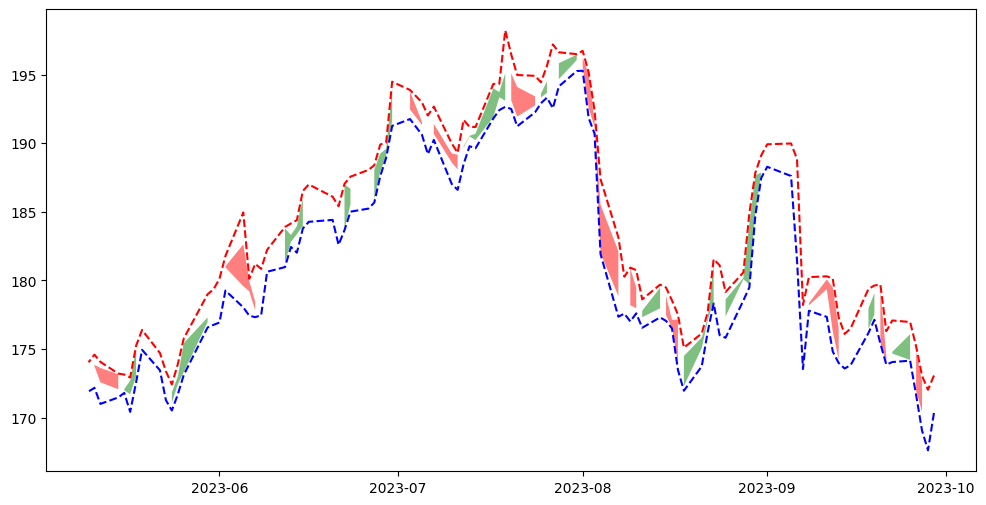

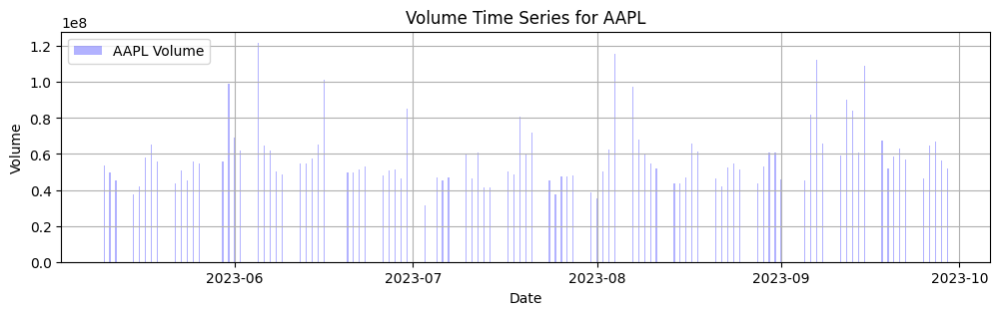

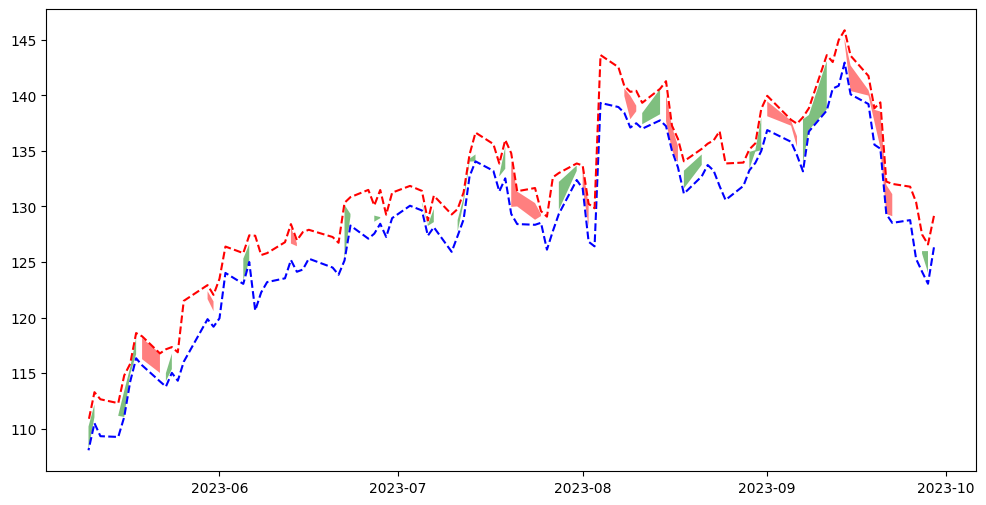

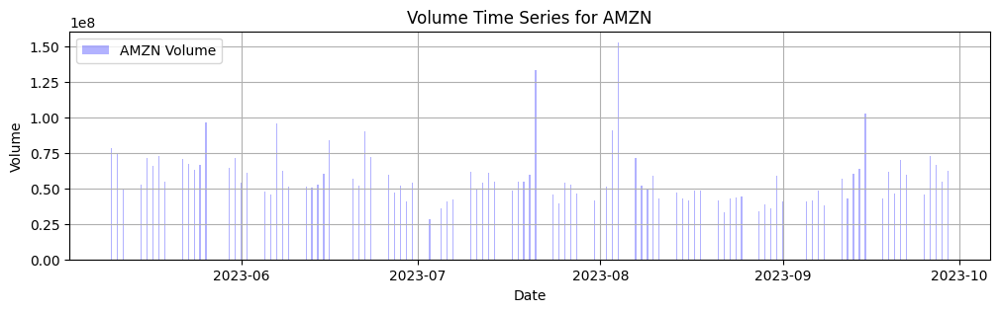

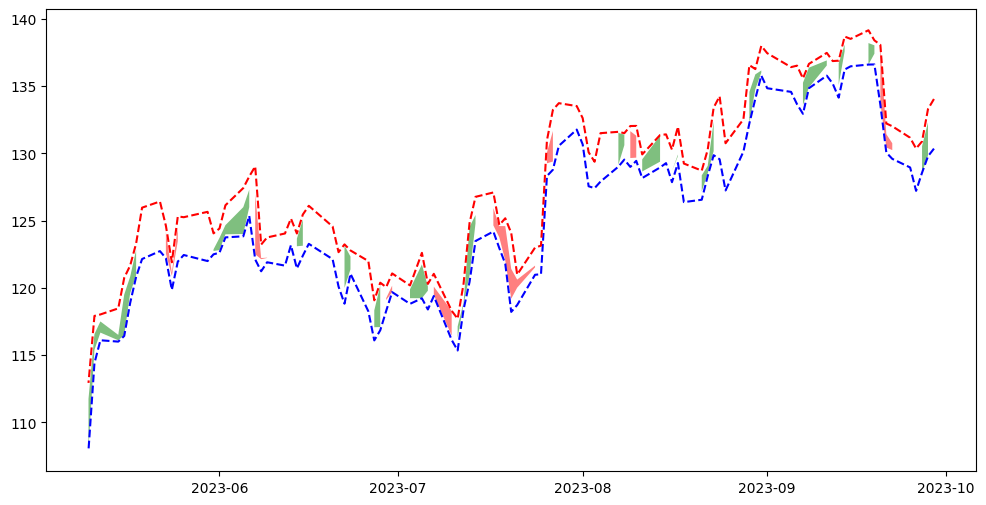

...

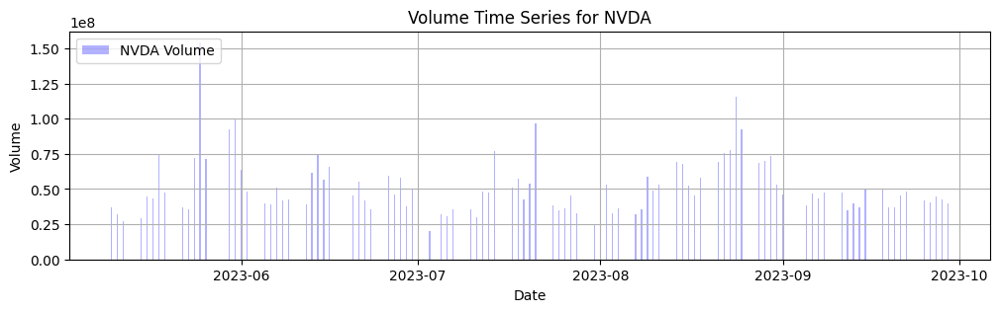

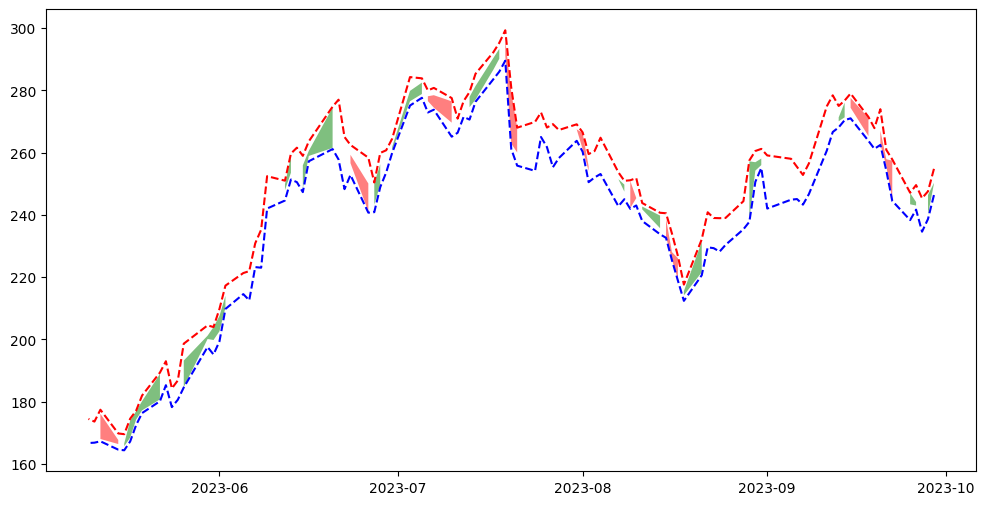

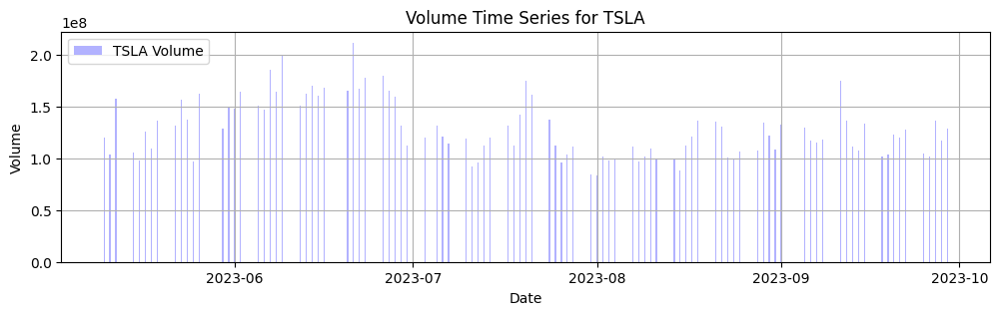

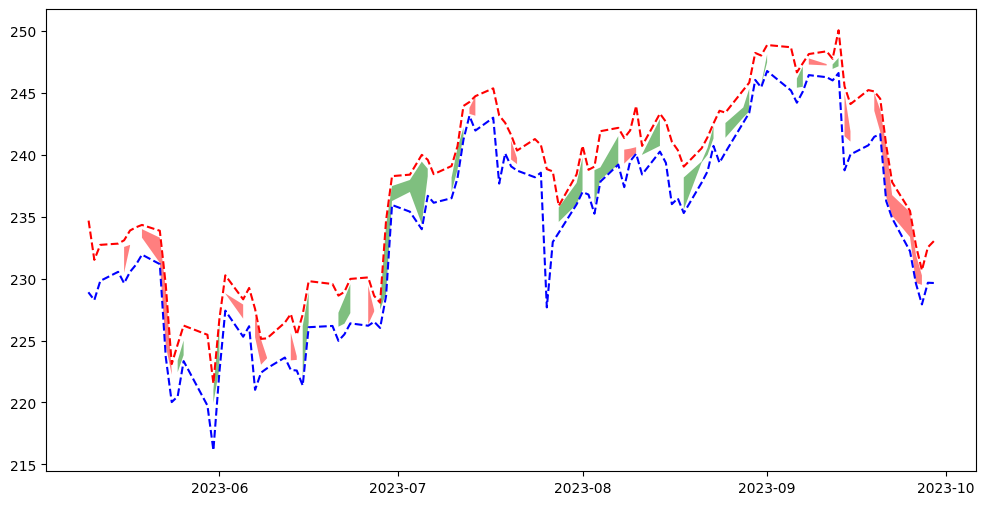

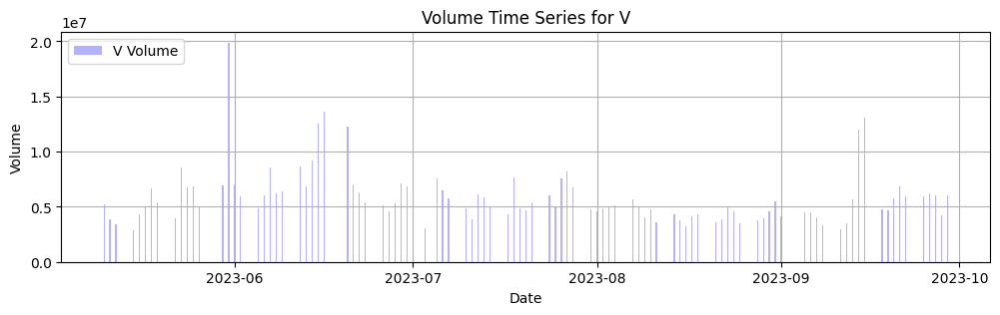

In [17]:
# Create a list of unique stock symbols in the DataFrame
stock_symbols = df['symbol'].unique()

# Create a color map for each stock symbol (you can customize this)
colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta', 'black']

# Loop through each stock symbol and create separate plots
for i, symbol in enumerate(stock_symbols):
    plt.figure(figsize=(12, 6))  # Set the figure size
    stock_df = df[df['symbol'] == symbol]
    dates = stock_df['timestamp']
    opens = stock_df['open']
    closes = stock_df['close']
    lows = stock_df['low']
    highs = stock_df['high']
    volumes = stock_df['volume']

    # Plot candlestick bars for open, close, low, high
    plt.plot(dates, lows, label=f'{symbol} Low', color='blue', linestyle='--')
    plt.plot(dates, highs, label=f'{symbol} High', color='red', linestyle='--')
    plt.fill_between(dates, opens, closes, where=opens <= closes, facecolor='green', alpha=0.5, label=f'{symbol} Up')
    plt.fill_between(dates, opens, closes, where=opens > closes, facecolor='red', alpha=0.5, label=f'{symbol} Down')

    # Create a separate subplot for volume
    plt.figure(figsize=(12, 3))  # Set the figure size for the volume chart
    plt.bar(dates, volumes, width=0.2, color='blue', alpha=0.3, label=f'{symbol} Volume')

    # Customize the plot for the volume chart
    plt.title(f'Volume Time Series for {symbol}')
    plt.xlabel('Date')
    plt.ylabel('Volume')
    plt.legend(loc='upper left')
    plt.grid(True)

    # Show the volume plot
    plt.show()

    # Close the volume plot before proceeding to the next stock
    plt.close()


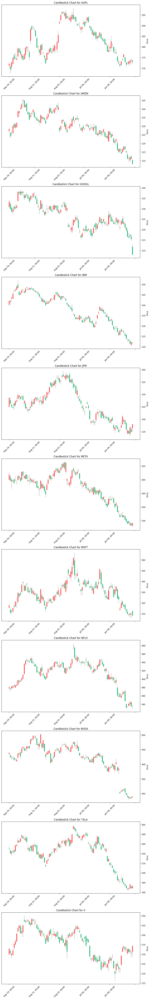

In [18]:
# Create subplots for each symbol
symbols = df_copy['symbol'].unique()
fig, axes = plt.subplots(nrows=len(symbols), ncols=1, figsize=(10, 6 * len(symbols)))

# Loop through each symbol and create a candlestick chart for that symbol
for i, symbol in enumerate(symbols):
    symbol_df = df_copy[df_copy['symbol'] == symbol]

    # Create a new axis for each subplot within the existing figure
    ax = axes[i]
    
    mpf.plot(symbol_df, type='candle', ax=ax, style='yahoo')
    
    # Set individual titles for each subplot
    ax.set_title(f'Candlestick Chart for {symbol}')

# Adjust spacing between subplots
plt.tight_layout()

plt.show()


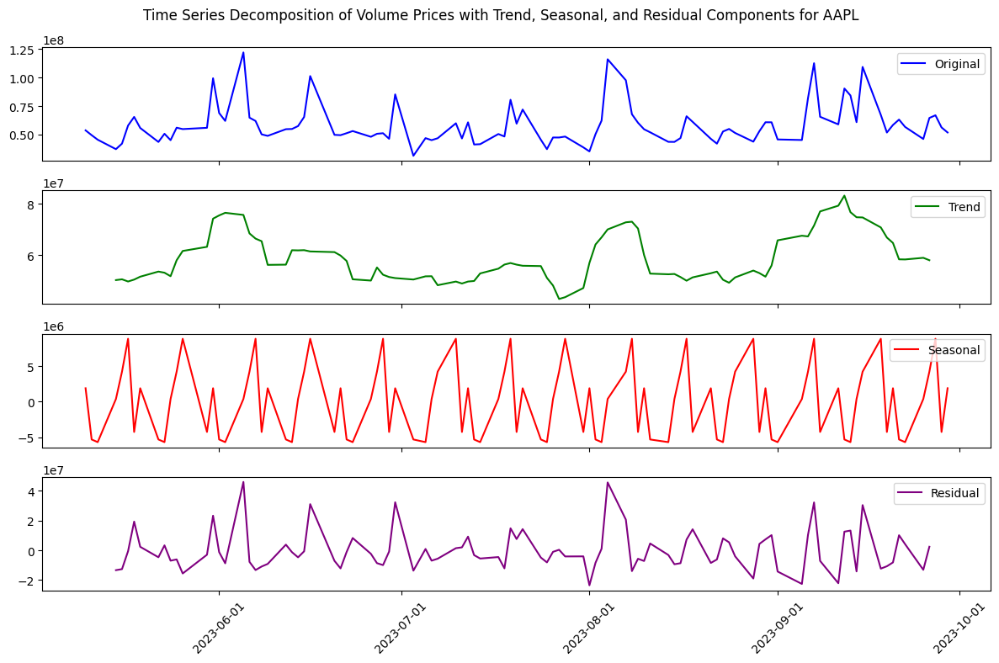

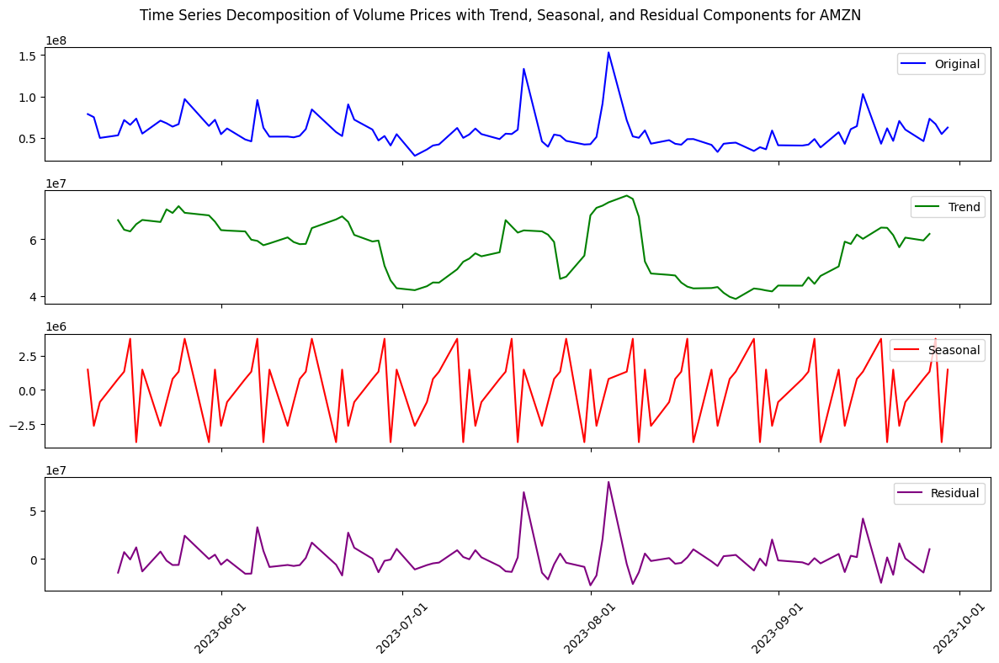

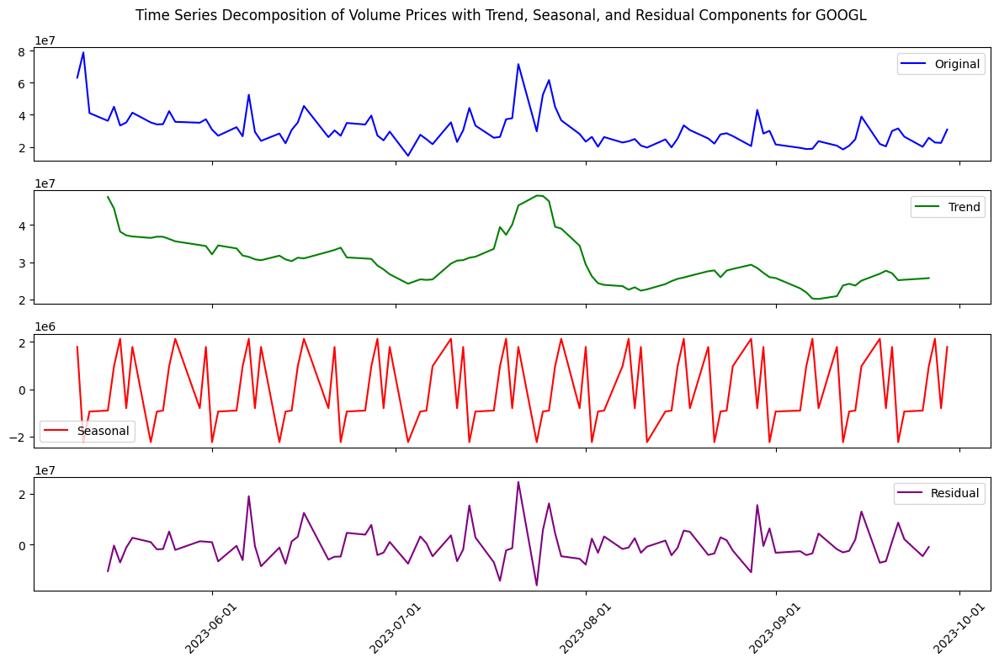

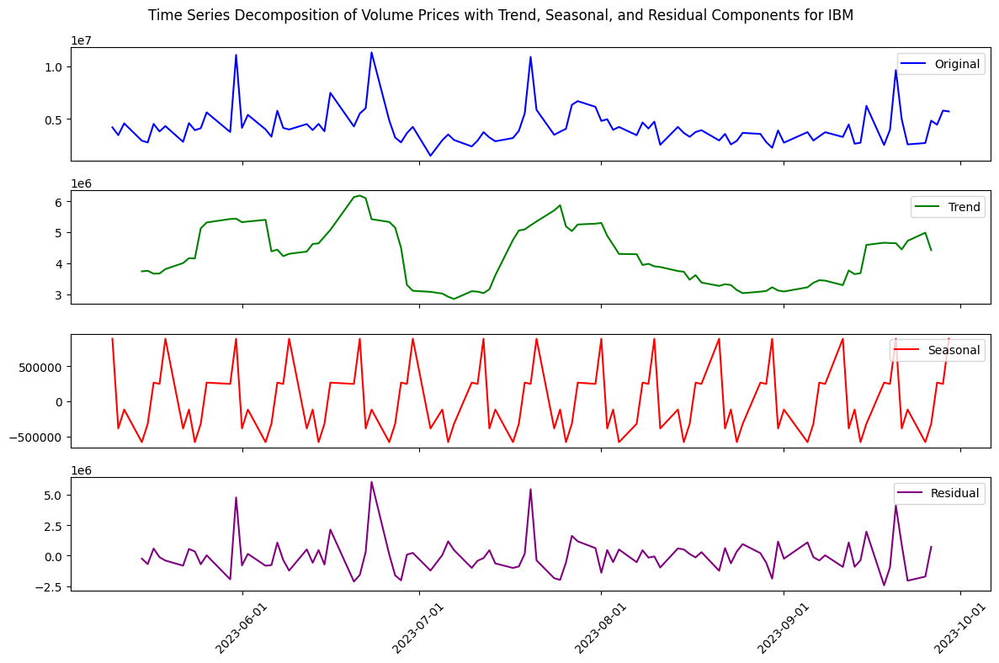

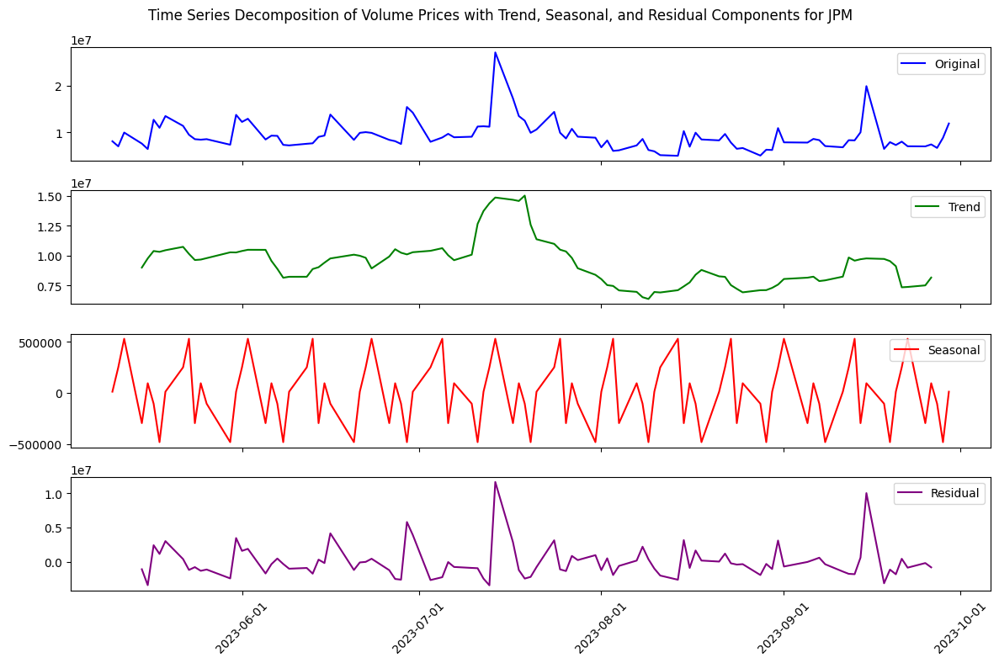

...

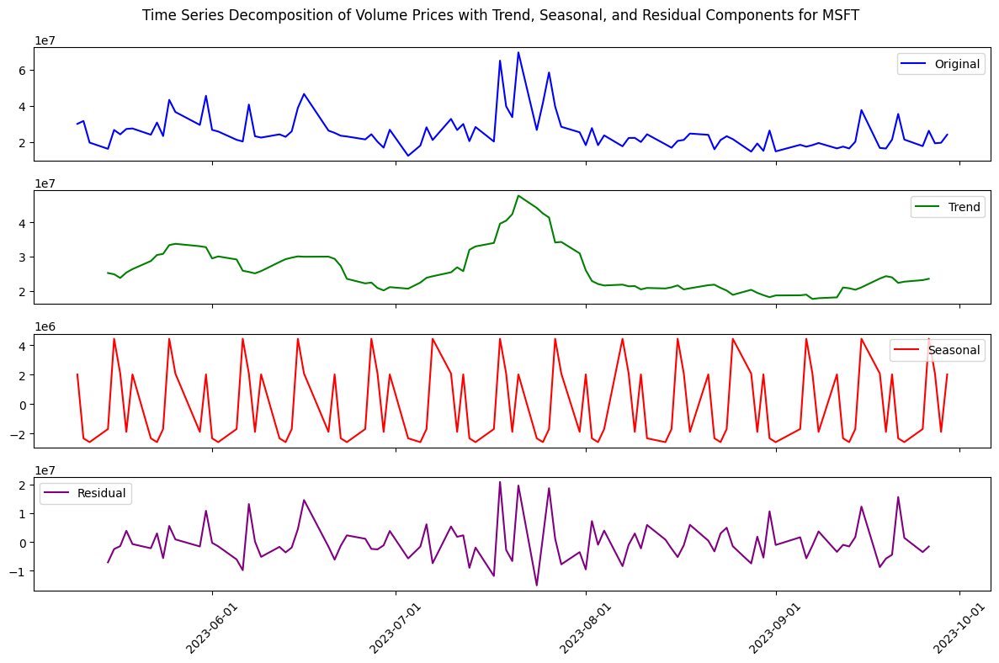

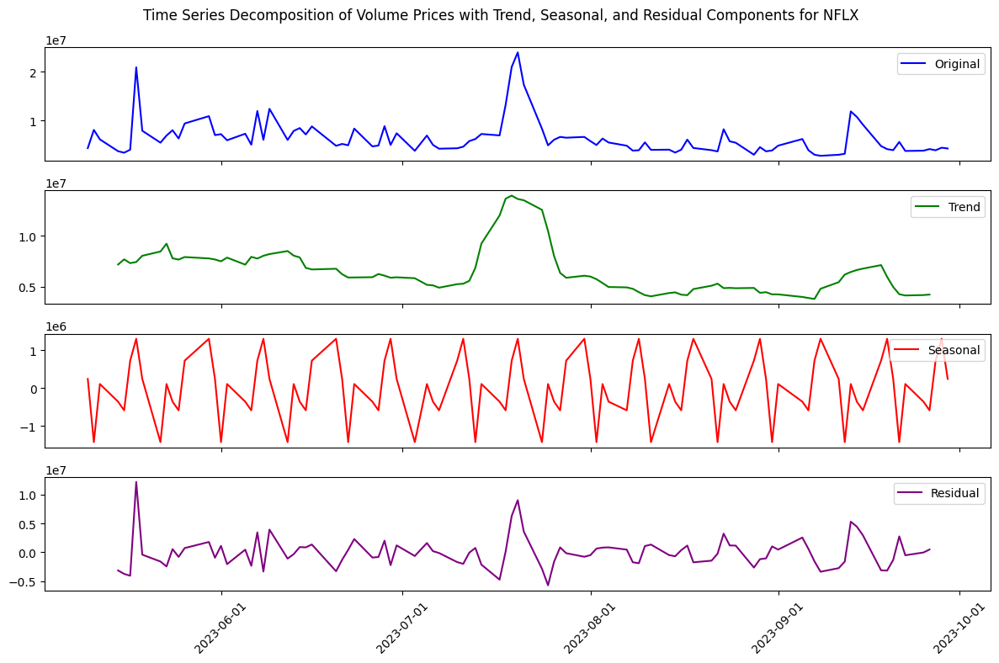

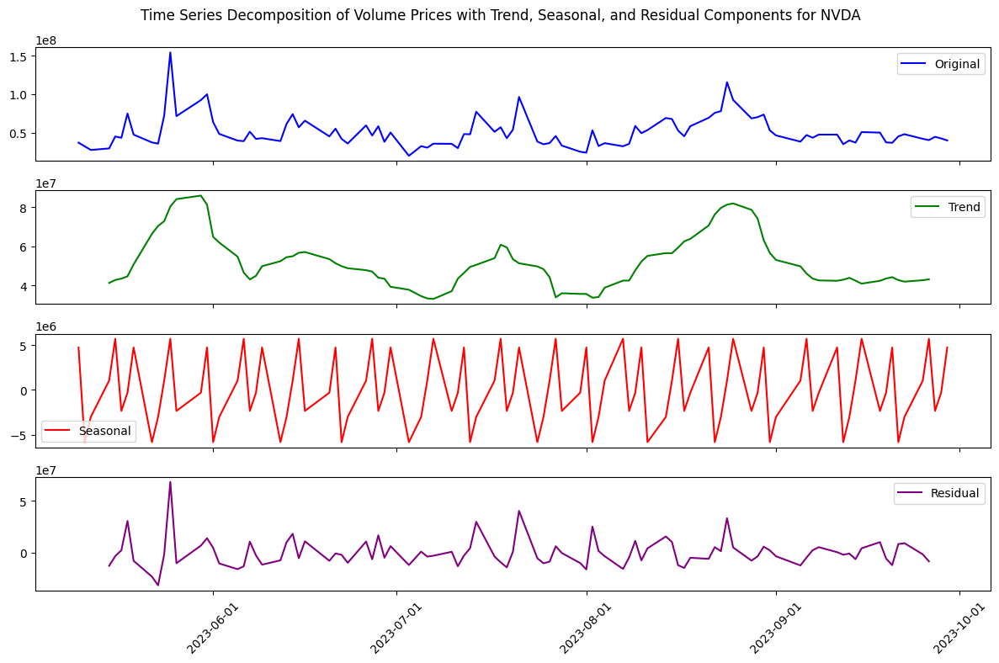

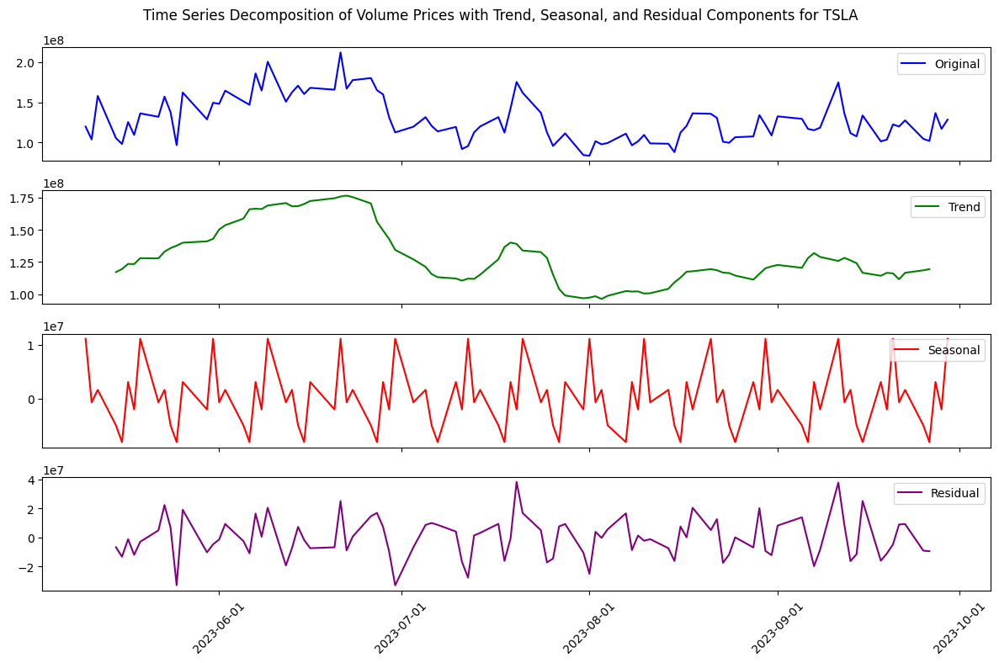

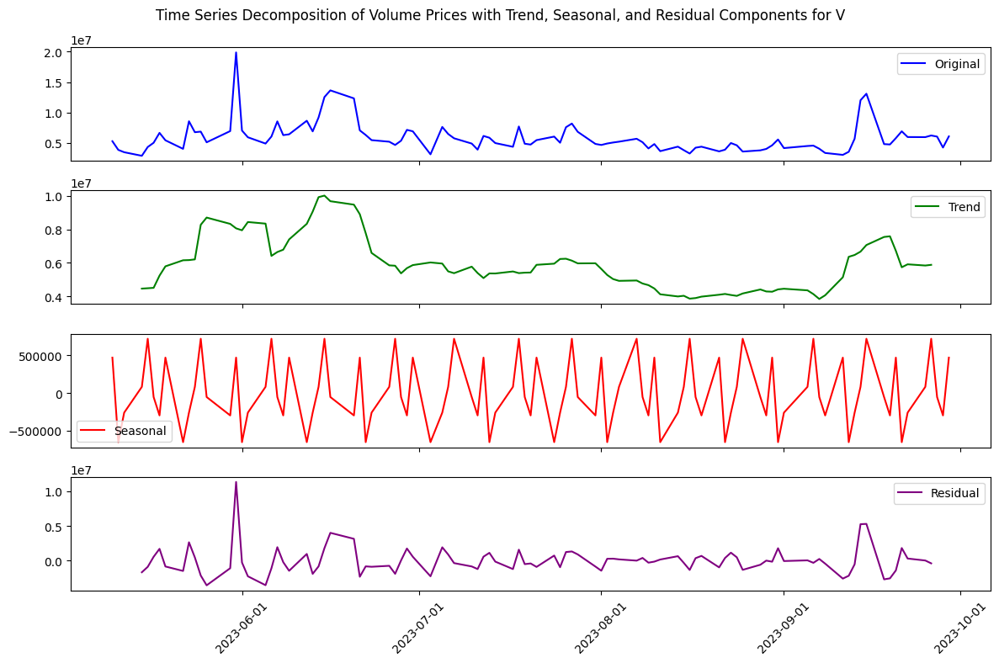

In [19]:
# import matplotlib.pyplot as plt
# import matplotlib.dates as mdates
# import statsmodels.api as sm

# Create a list of unique stock symbols in the DataFrame
stock_symbols = df_copy['symbol'].unique()

# Create a color map for each stock symbol (you can customize this)
colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta', 'black']

# Loop through each stock symbol and create separate plots
for i, symbol in enumerate(stock_symbols):
    # Filter the DataFrame for the specific stock symbol
    stock_df = df_copy[df_copy['symbol'] == symbol]

    # Set the figure size and subplot layout
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 8), sharex=True)

    # Perform time series decomposition for the current stock's volume data
    decomposition = sm.tsa.seasonal_decompose(stock_df['volume'], period=7)

    # Plot the original time series
    ax1.plot(stock_df.index, stock_df['volume'], label='Original', color='blue')
    ax1.legend()

    # Plot the trend component
    ax2.plot(decomposition.trend, label='Trend', color='green')
    ax2.legend()

    # Plot the seasonal component
    ax3.plot(decomposition.seasonal, label='Seasonal', color='red')
    ax3.legend()

    # Plot the residual component
    ax4.plot(decomposition.resid, label='Residual', color='purple')
    ax4.legend()

    # Format the x-axis date labels on the last subplot and rotate them for readability
    ax4.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax4.tick_params(axis='x', rotation=45)

    # Set a title for the current stock's decomposition plot
    plt.suptitle(f"Time Series Decomposition of Volume Prices with Trend, Seasonal, and Residual Components for {symbol}")

    # Adjust subplot layout
    plt.tight_layout()

    # Show the plot for the current stock symbol
    plt.show()

    # Close the current plot before proceeding to the next stock
    plt.close()


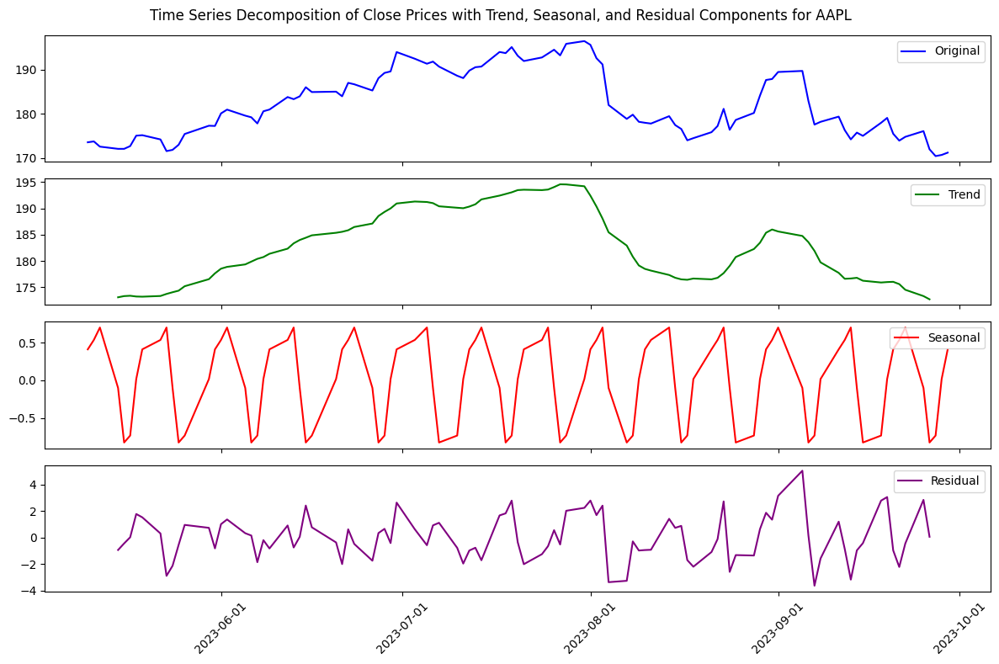

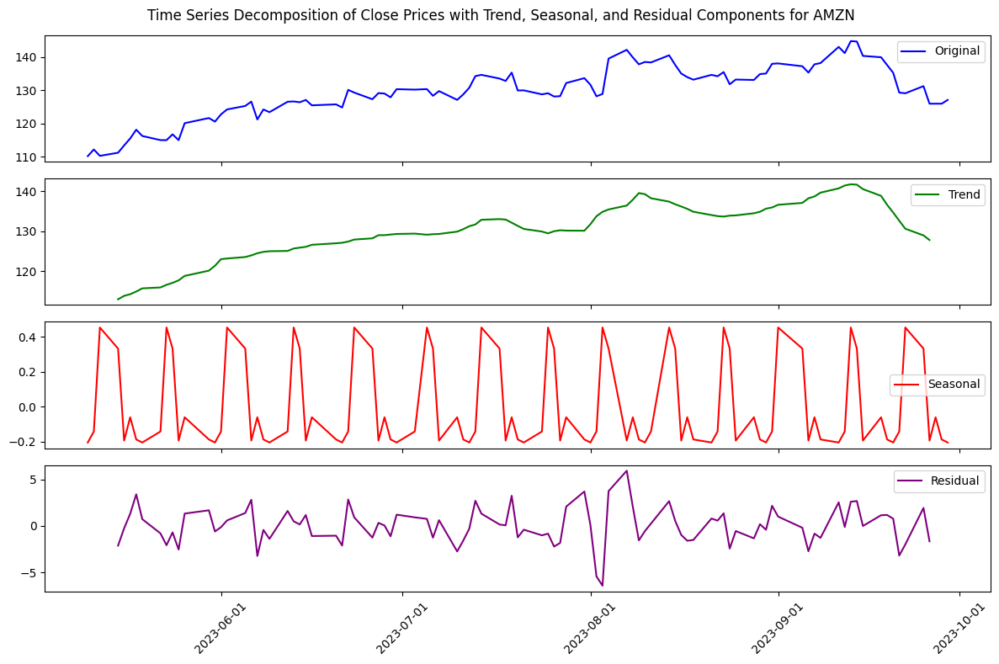

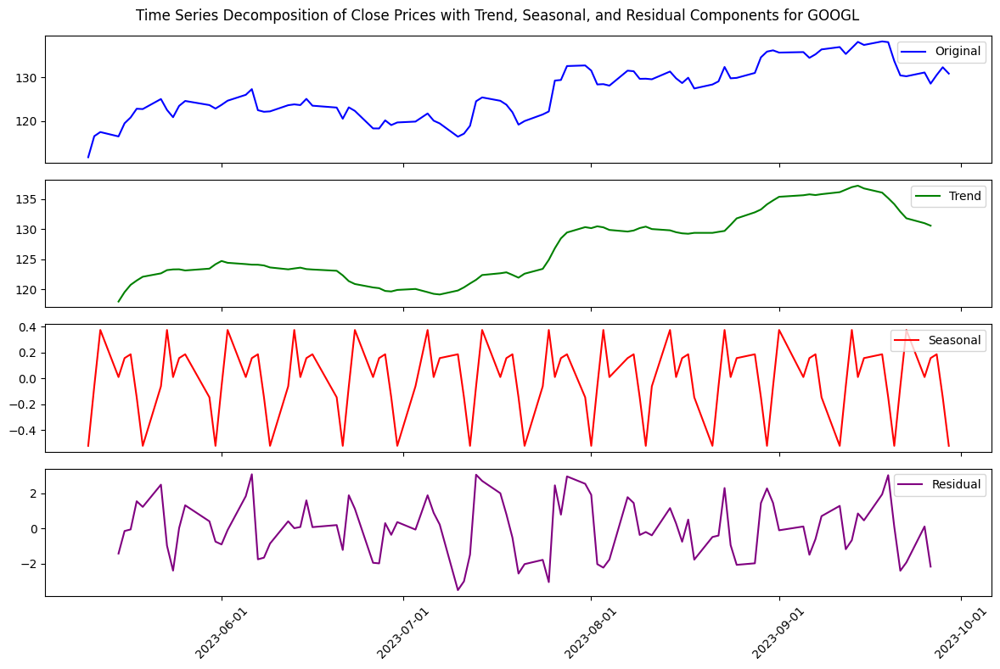

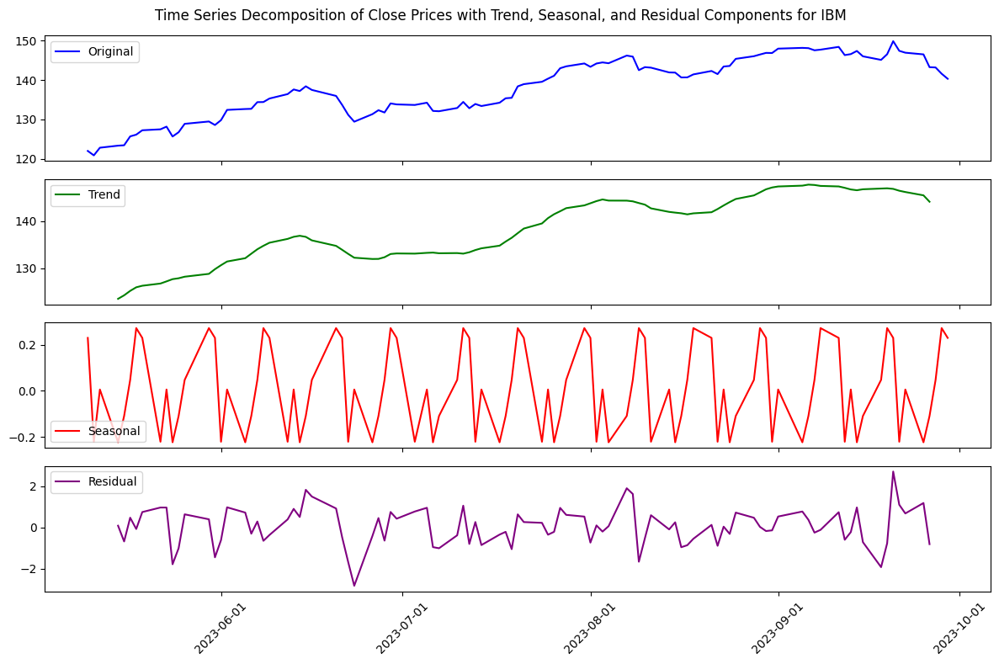

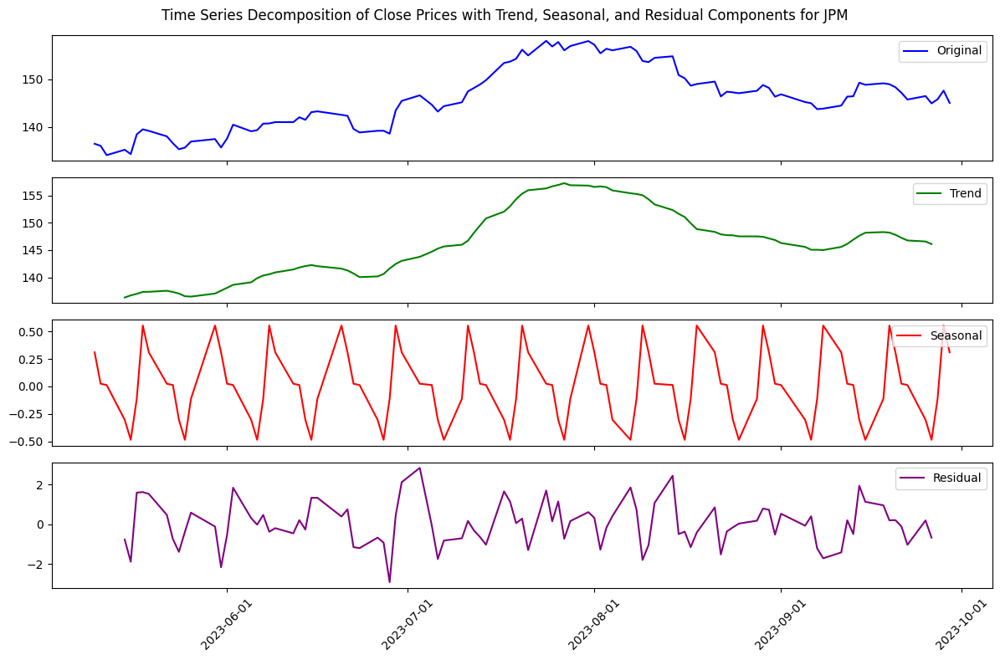

...

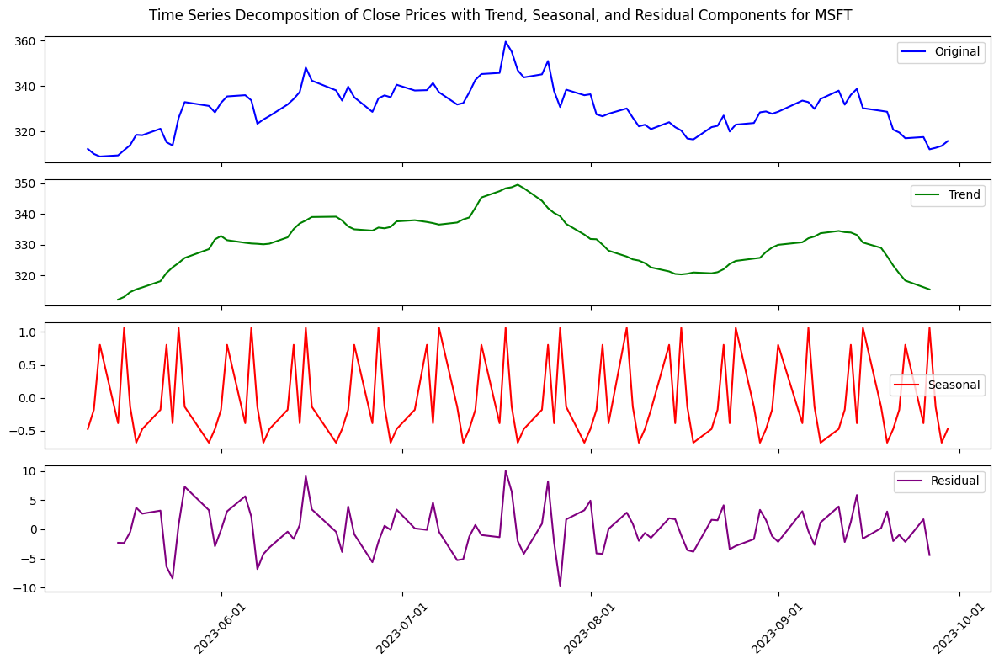

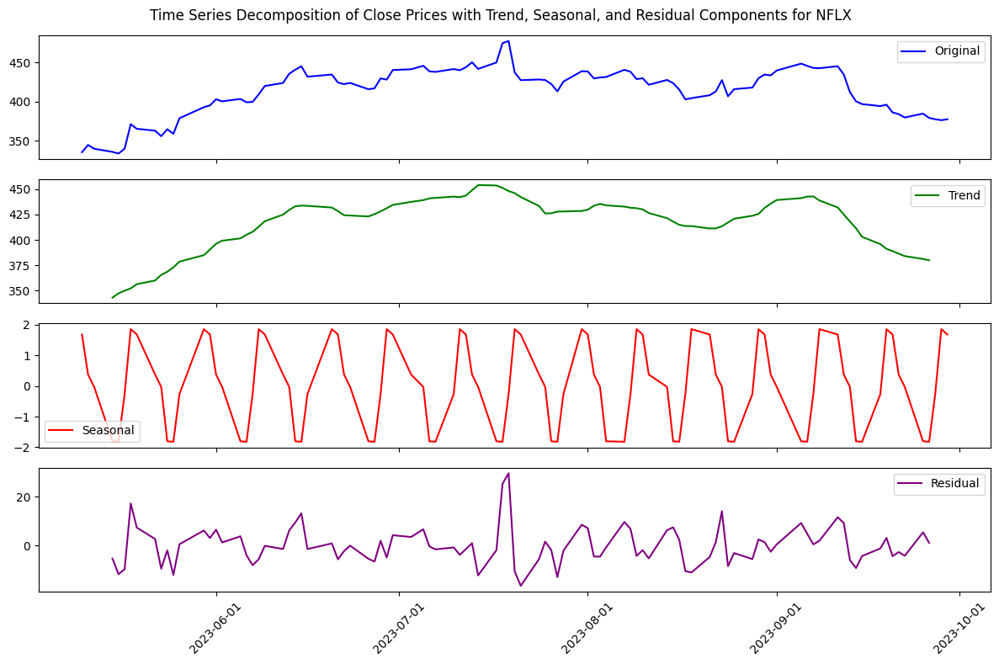

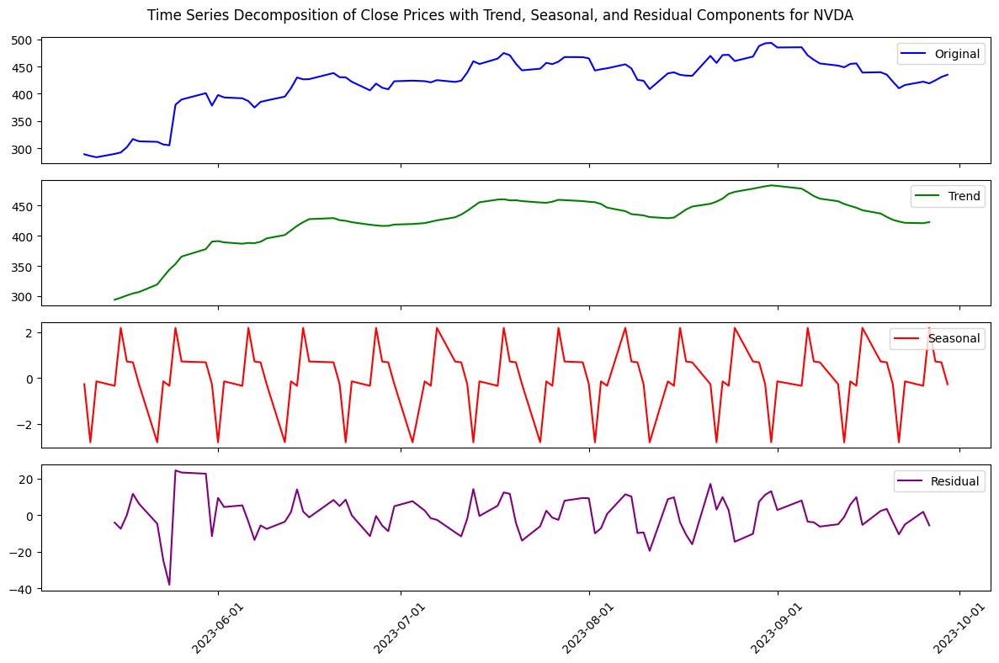

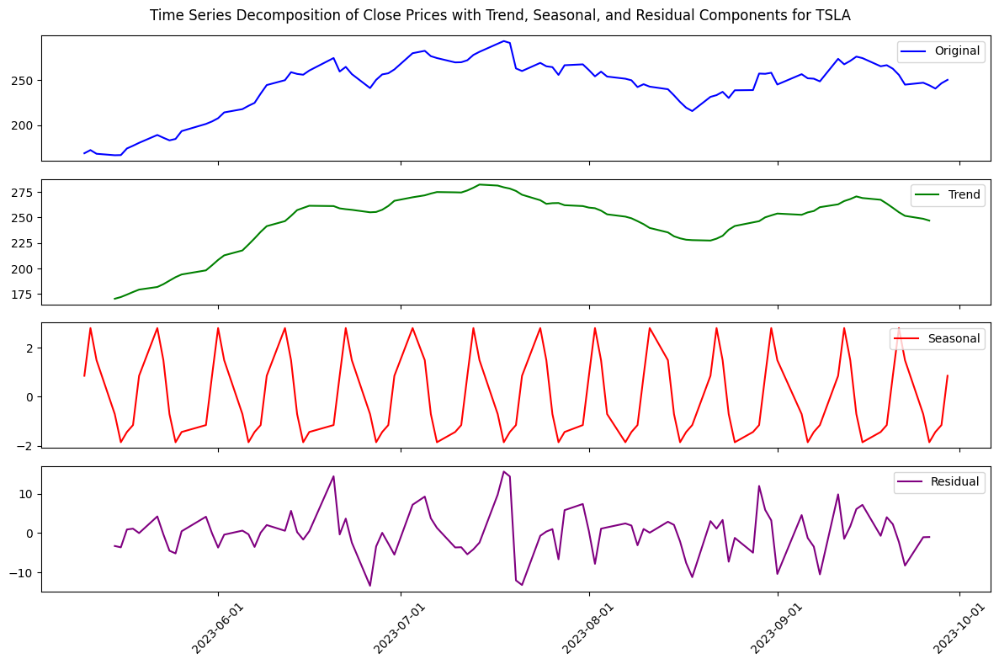

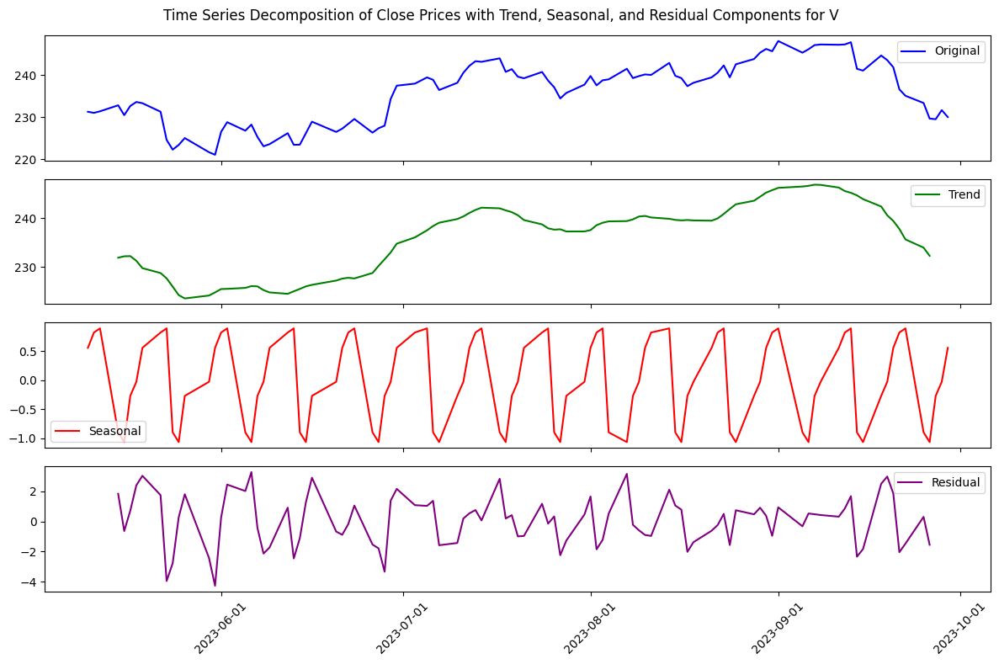

In [20]:
# Create a list of unique stock symbols in the DataFrame
stock_symbols = df_copy['symbol'].unique()

# Create a color map for each stock symbol (you can customize this)
colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta', 'black']

# Loop through each stock symbol and create separate plots
for i, symbol in enumerate(stock_symbols):
    # Filter the DataFrame for the specific stock symbol
    stock_df = df_copy[df_copy['symbol'] == symbol]

    # Set the figure size and subplot layout
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 8), sharex=True)

    # Perform time series decomposition for the current stock's volume data
    decomposition = sm.tsa.seasonal_decompose(stock_df['close'], period=7)

    # Plot the original time series
    ax1.plot(stock_df.index, stock_df['close'], label='Original', color='blue')
    ax1.legend()

    # Plot the trend component
    ax2.plot(decomposition.trend, label='Trend', color='green')
    ax2.legend()

    # Plot the seasonal component
    ax3.plot(decomposition.seasonal, label='Seasonal', color='red')
    ax3.legend()

    # Plot the residual component
    ax4.plot(decomposition.resid, label='Residual', color='purple')
    ax4.legend()

    # Format the x-axis date labels on the last subplot and rotate them for readability
    ax4.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax4.tick_params(axis='x', rotation=45)

    # Set a title for the current stock's decomposition plot
    plt.suptitle(f"Time Series Decomposition of Close Prices with Trend, Seasonal, and Residual Components for {symbol}")

    # Adjust subplot layout
    plt.tight_layout()

    # Show the plot for the current stock symbol
    plt.show()

    # Close the current plot before proceeding to the next stock
    plt.close()


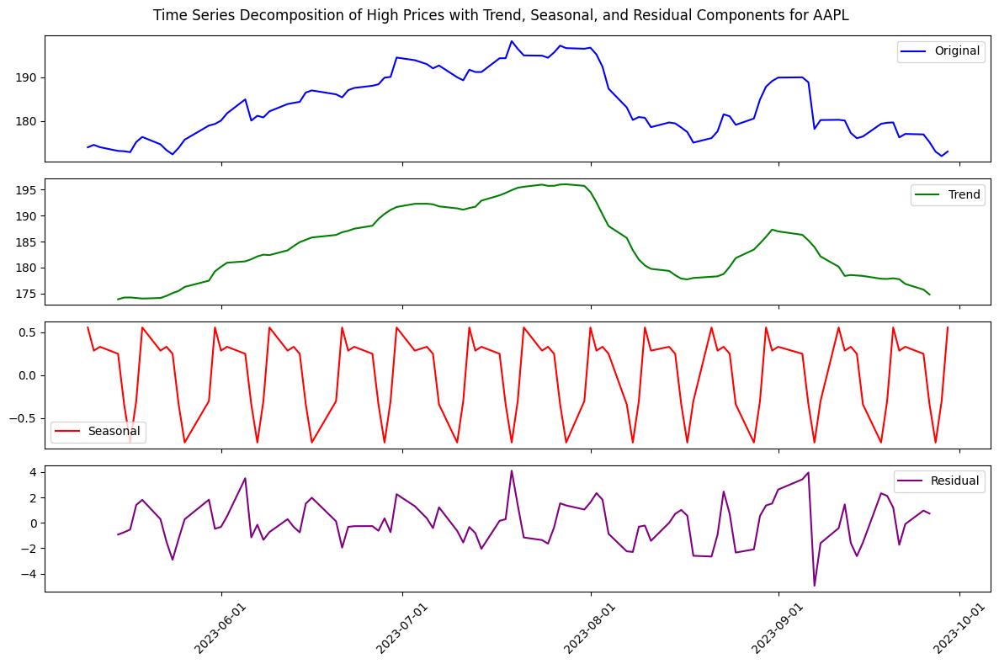

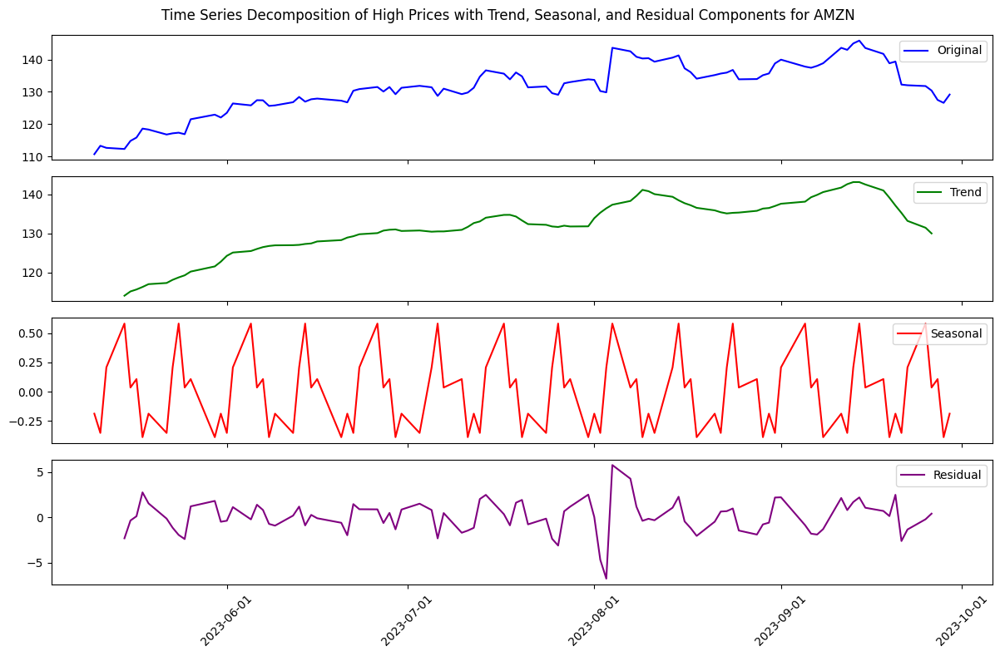

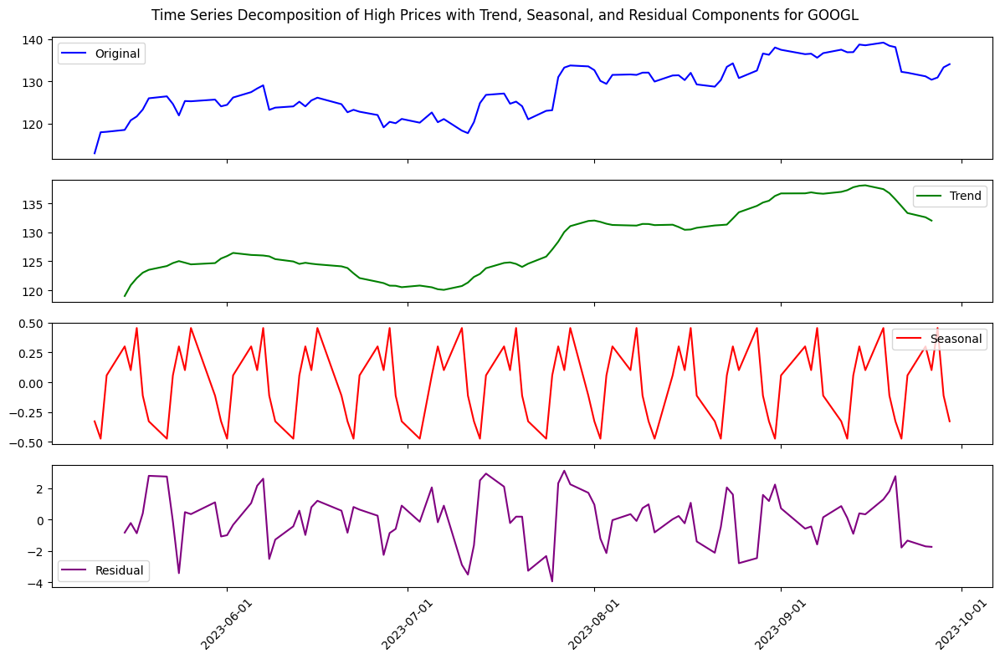

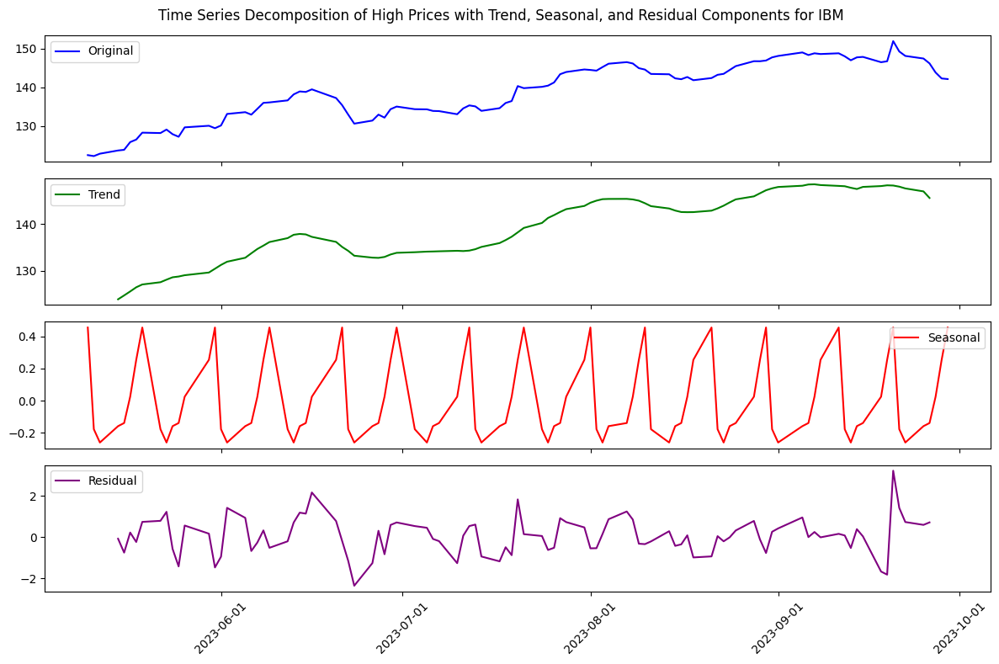

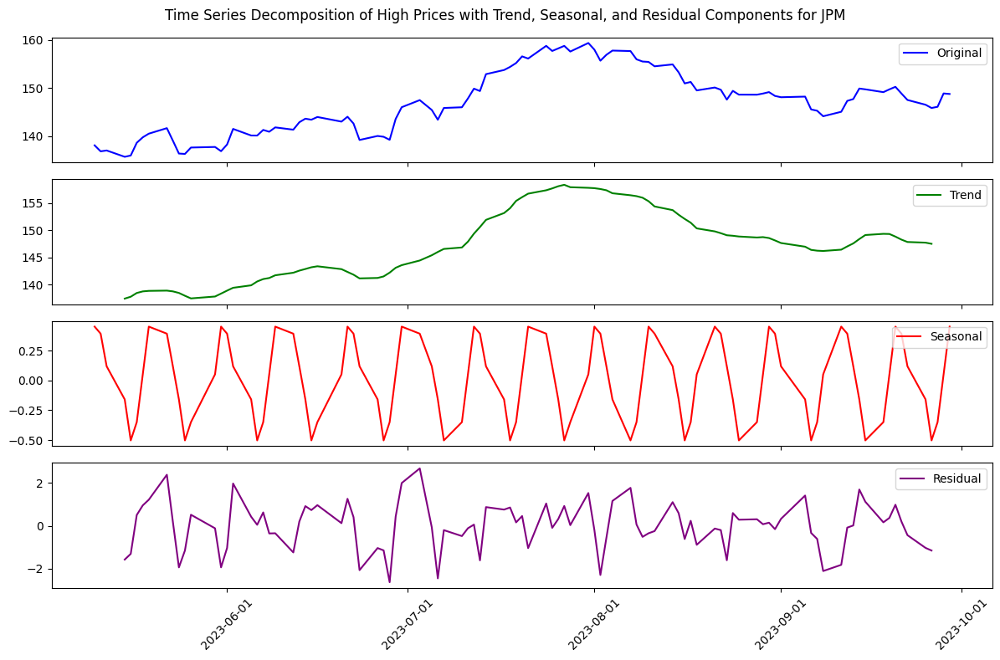

...

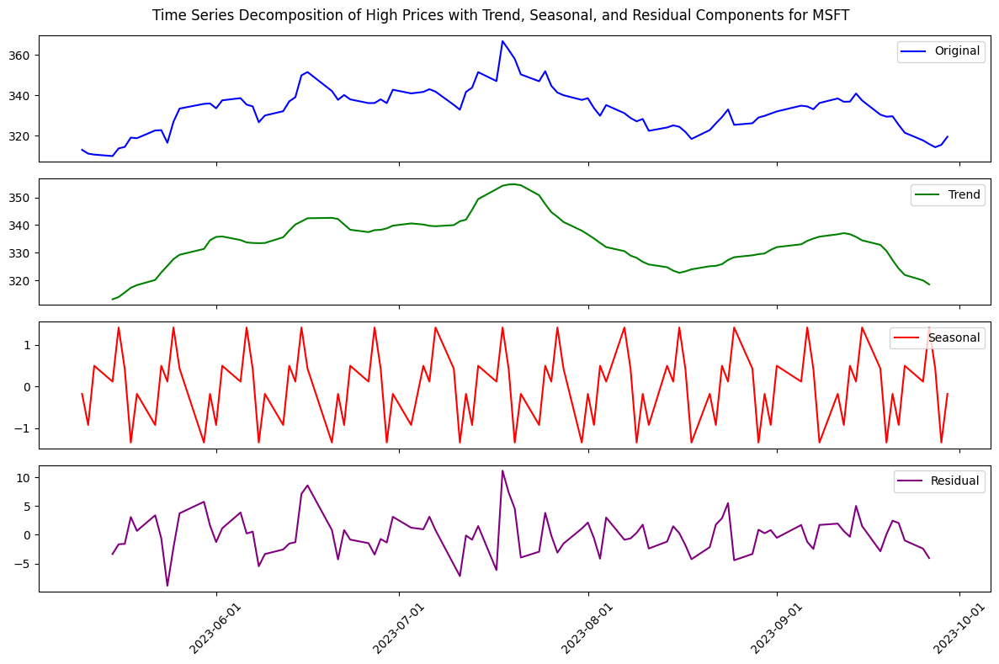

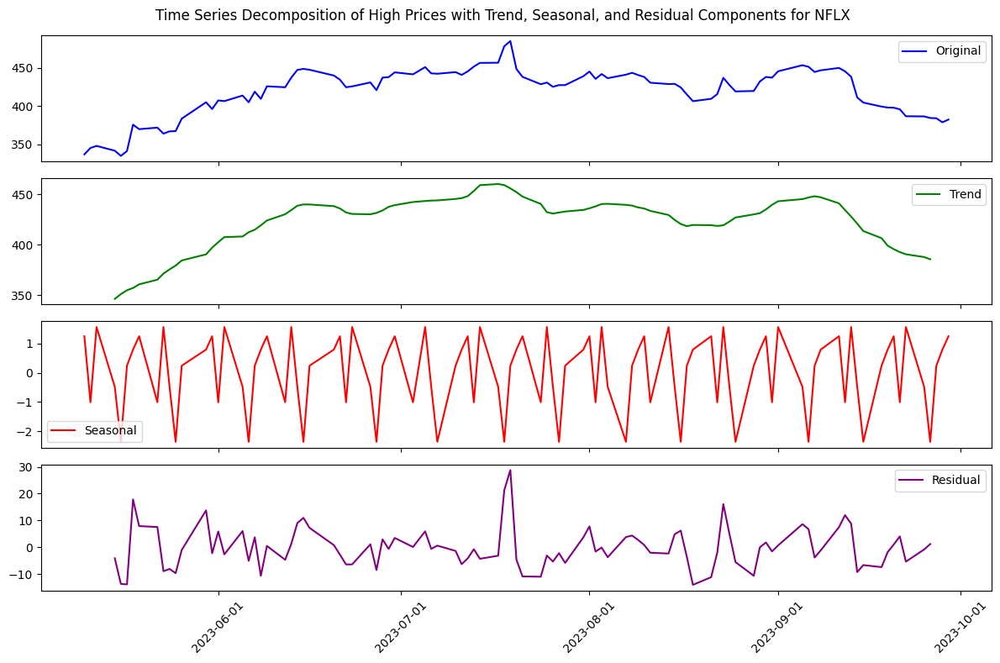

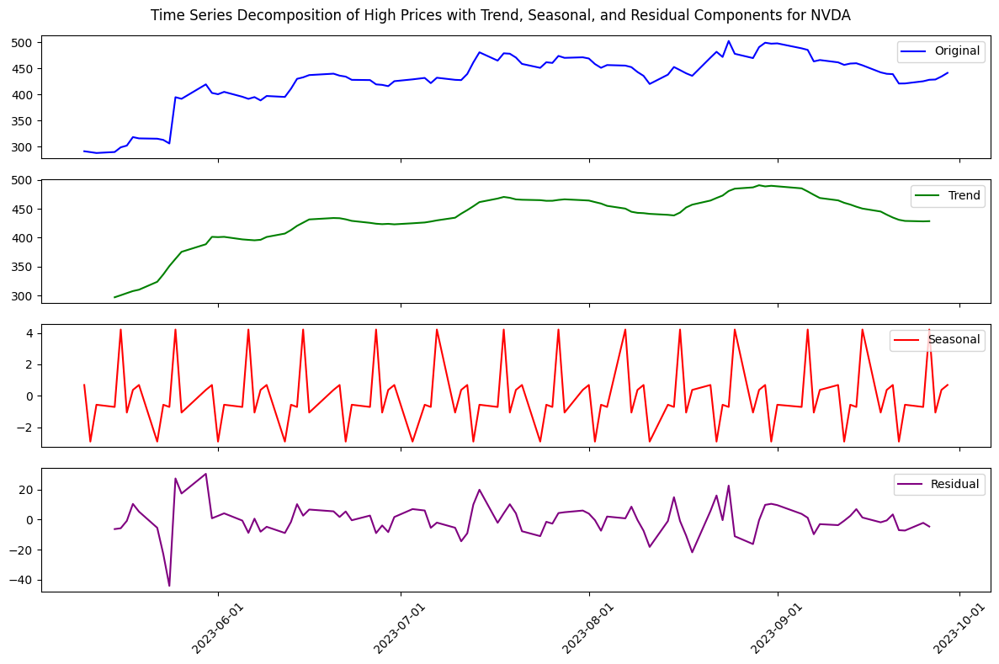

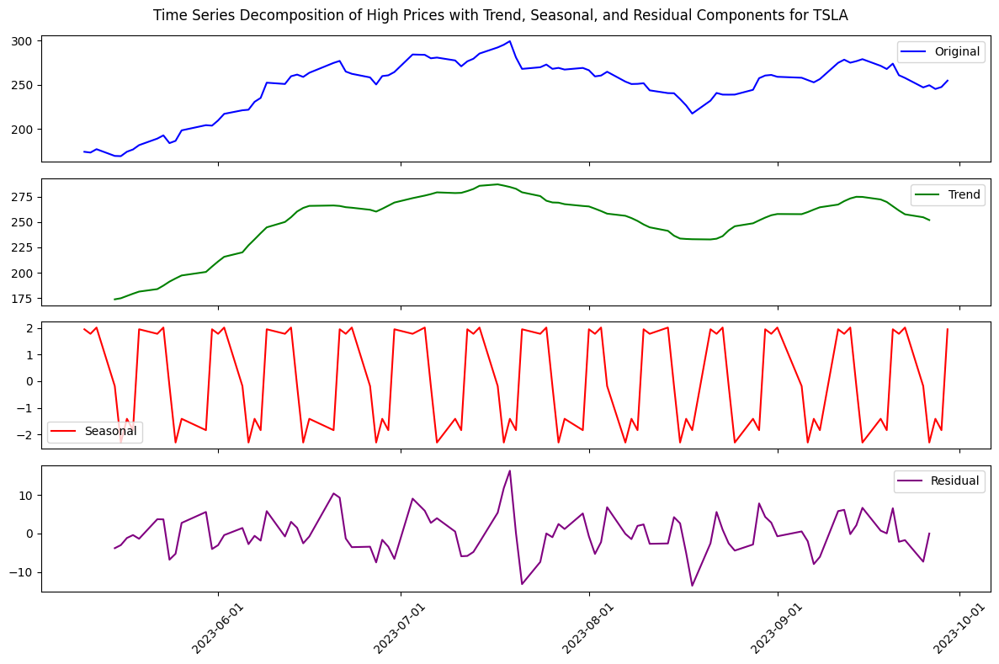

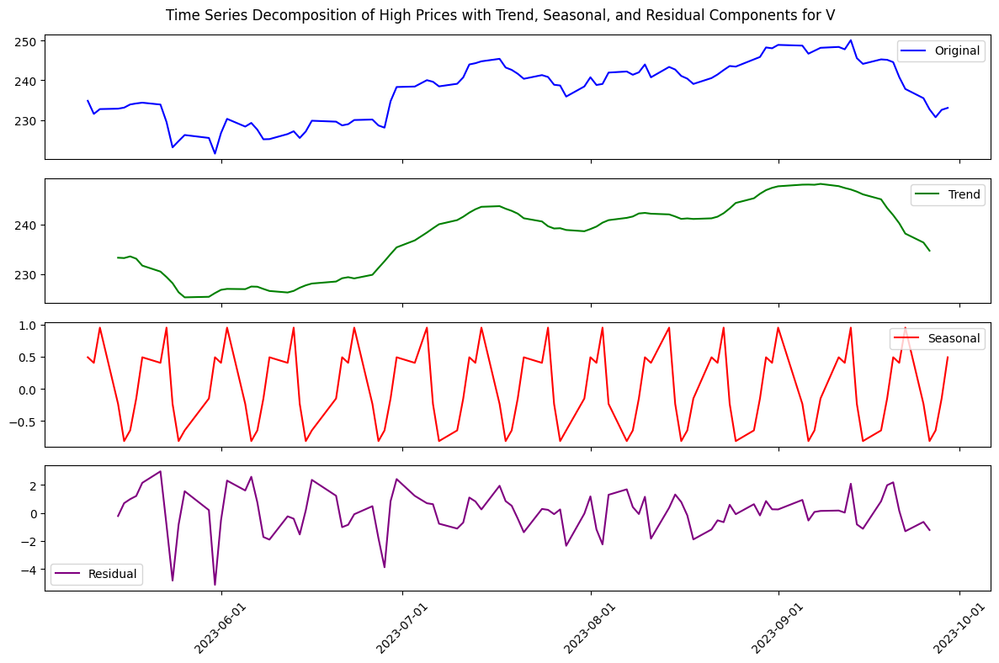

In [21]:
# Create a list of unique stock symbols in the DataFrame
stock_symbols = df_copy['symbol'].unique()

# Create a color map for each stock symbol (you can customize this)
colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta', 'black']

# Loop through each stock symbol and create separate plots
for i, symbol in enumerate(stock_symbols):
    # Filter the DataFrame for the specific stock symbol
    stock_df = df_copy[df_copy['symbol'] == symbol]

    # Set the figure size and subplot layout
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 8), sharex=True)

    # Perform time series decomposition for the current stock's volume data
    decomposition = sm.tsa.seasonal_decompose(stock_df['high'], period=7)

    # Plot the original time series
    ax1.plot(stock_df.index, stock_df['high'], label='Original', color='blue')
    ax1.legend()

    # Plot the trend component
    ax2.plot(decomposition.trend, label='Trend', color='green')
    ax2.legend()

    # Plot the seasonal component
    ax3.plot(decomposition.seasonal, label='Seasonal', color='red')
    ax3.legend()

    # Plot the residual component
    ax4.plot(decomposition.resid, label='Residual', color='purple')
    ax4.legend()

    # Format the x-axis date labels on the last subplot and rotate them for readability
    ax4.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax4.tick_params(axis='x', rotation=45)

    # Set a title for the current stock's decomposition plot
    plt.suptitle(f"Time Series Decomposition of High Prices with Trend, Seasonal, and Residual Components for {symbol}")

    # Adjust subplot layout
    plt.tight_layout()

    # Show the plot for the current stock symbol
    plt.show()

    # Close the current plot before proceeding to the next stock
    plt.close()

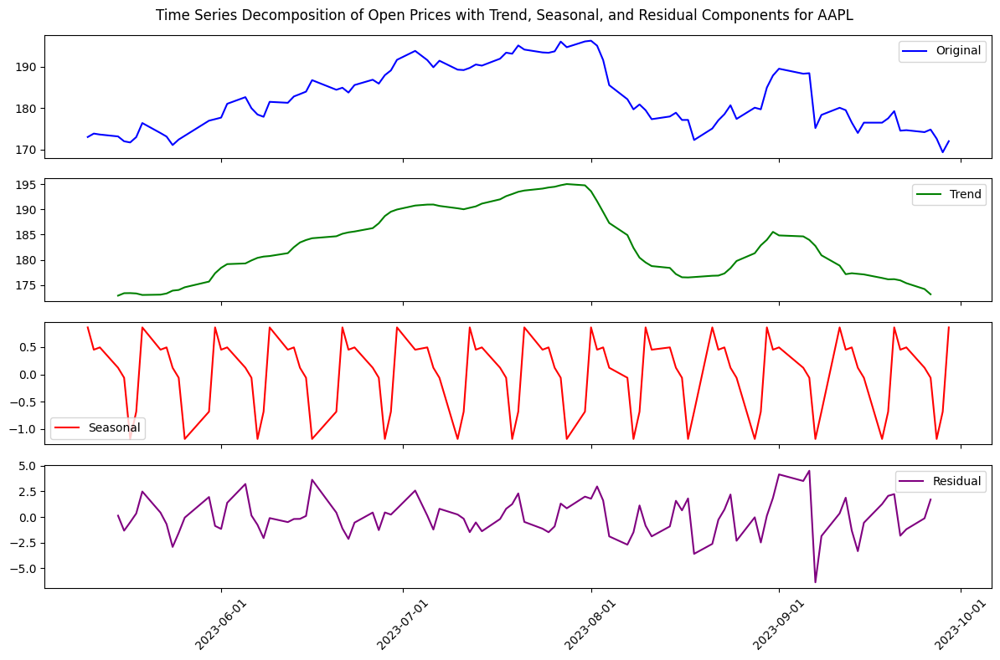

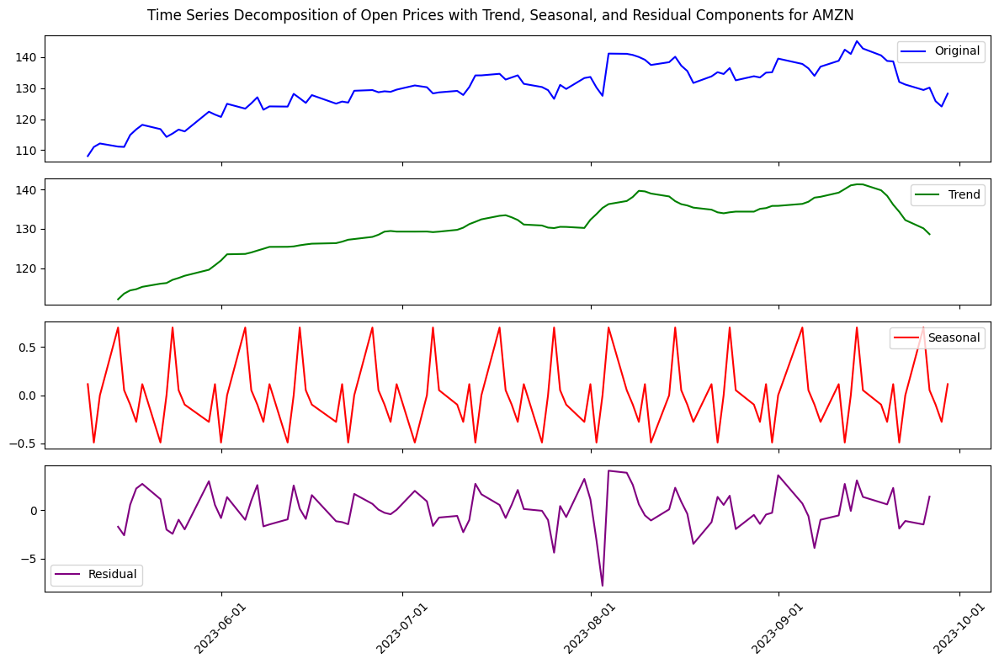

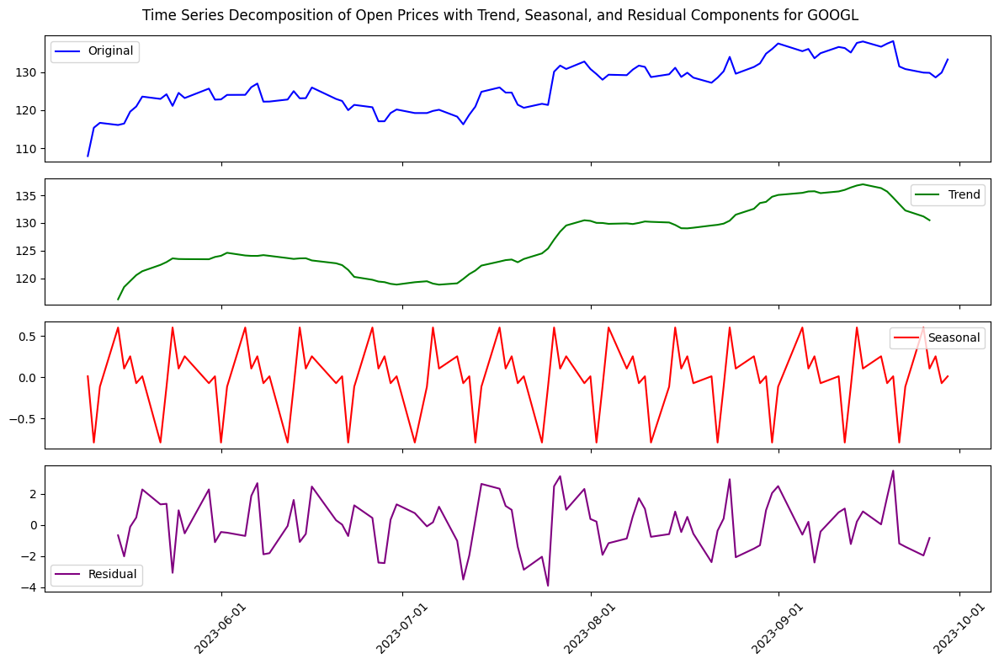

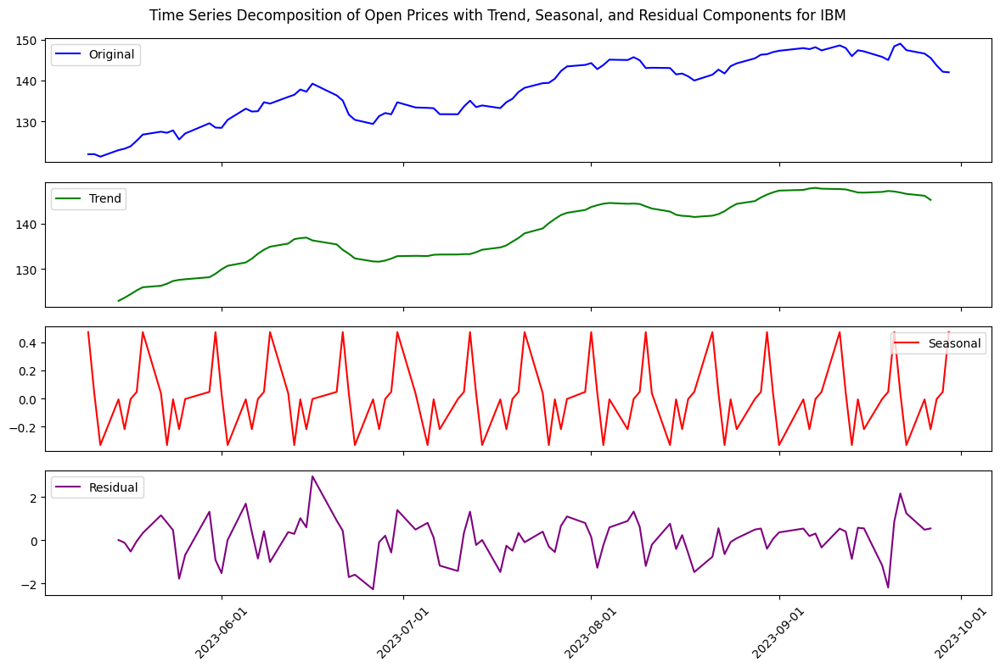

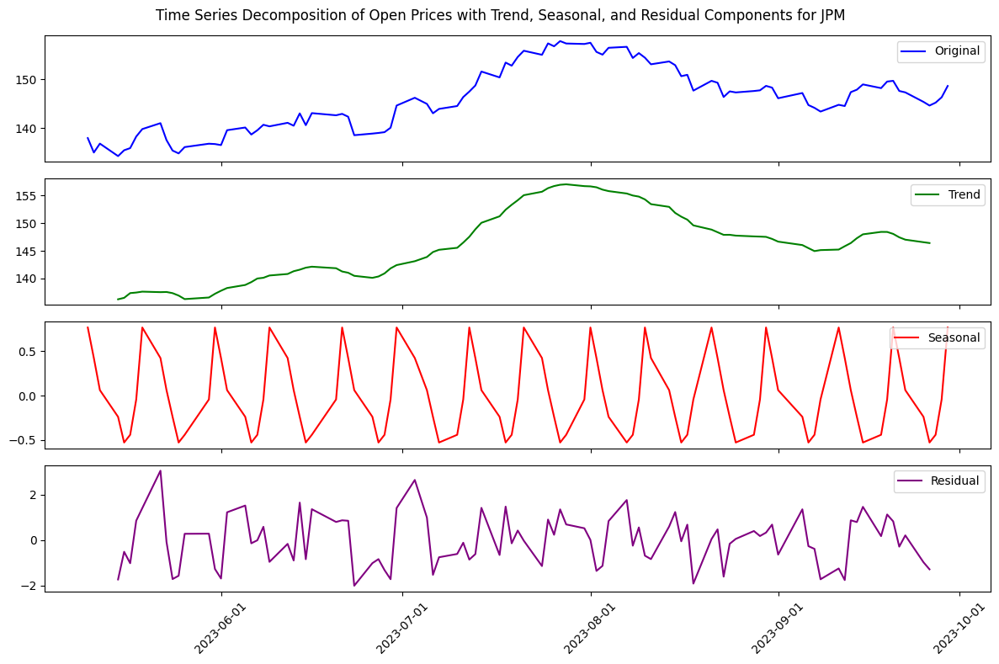

...

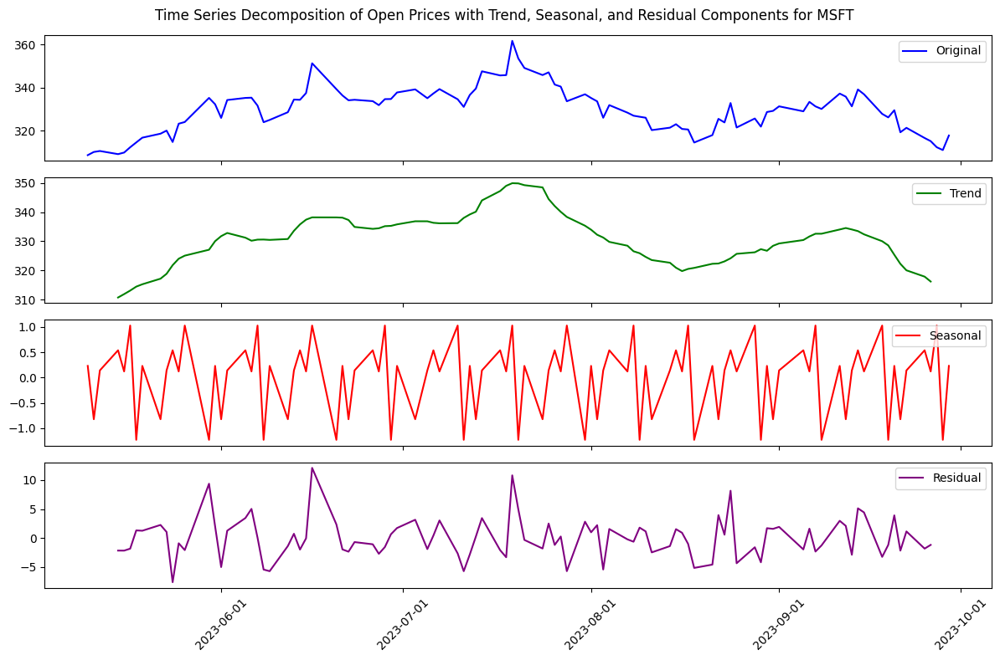

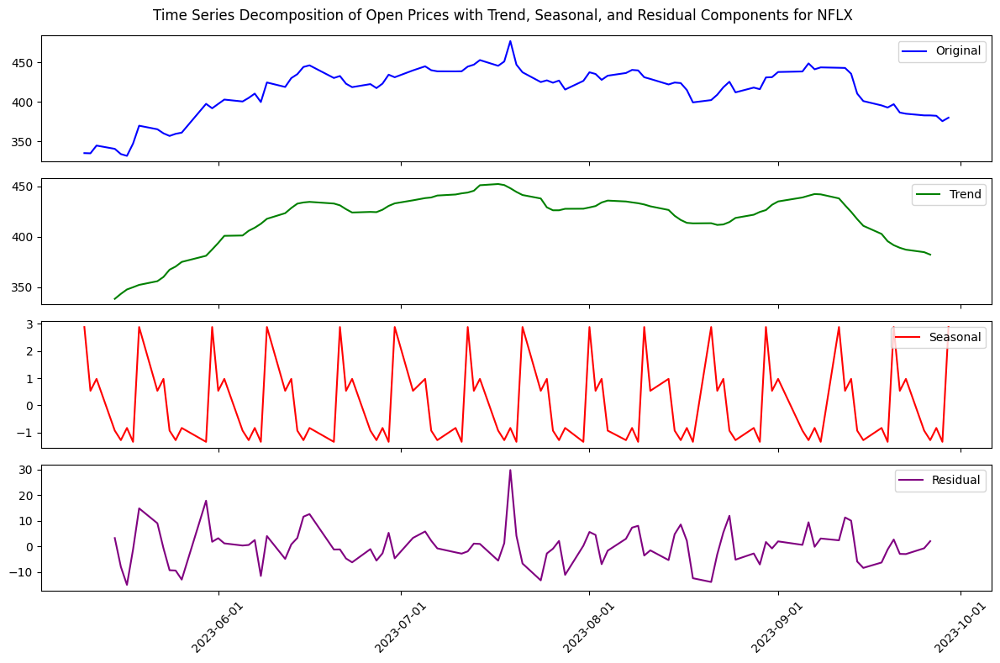

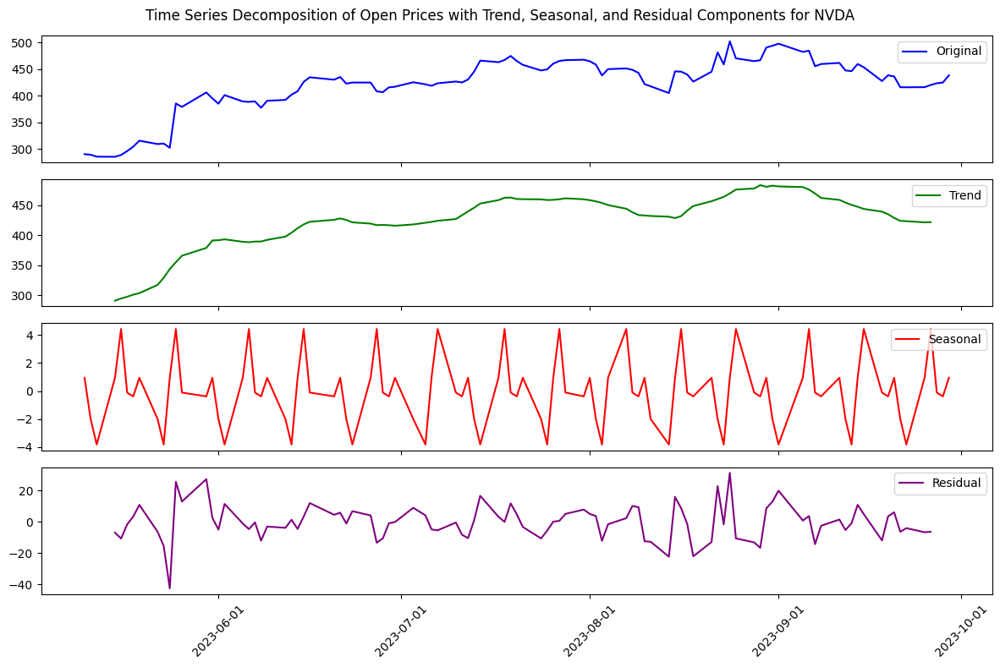

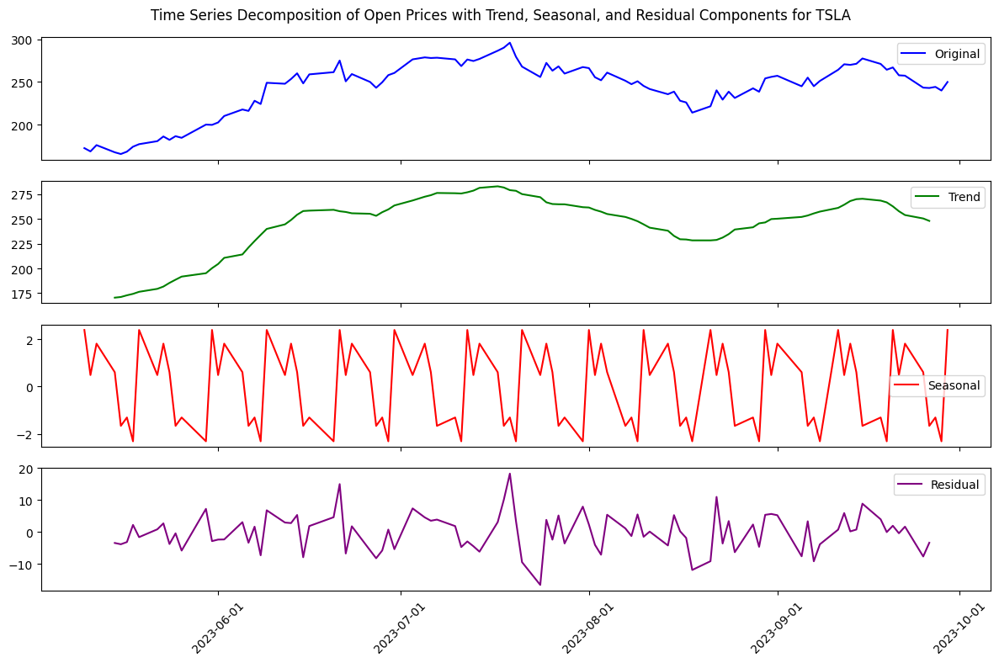

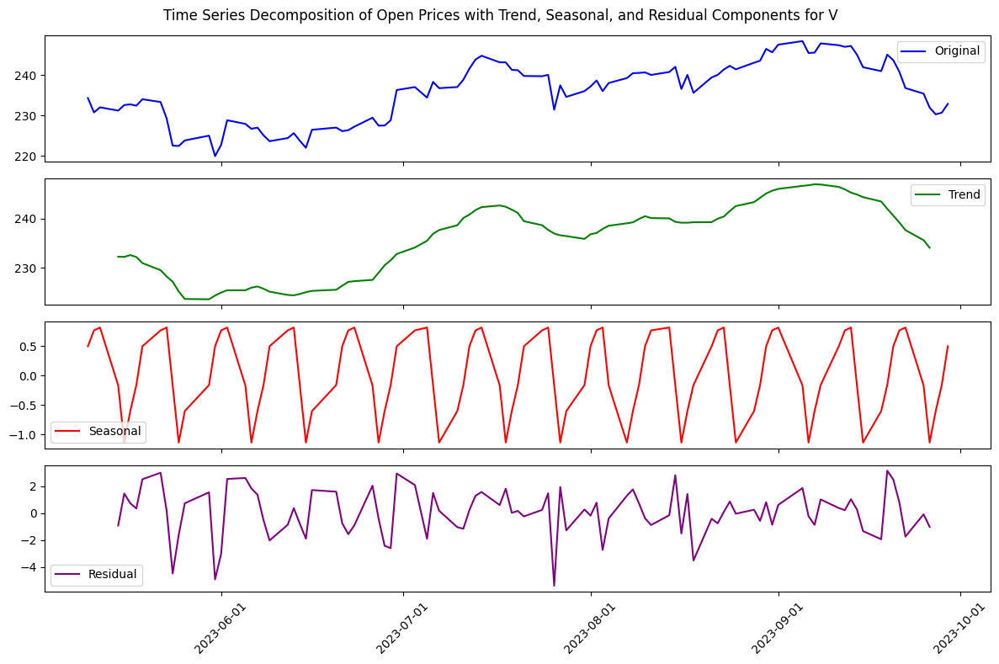

In [22]:
# Create a list of unique stock symbols in the DataFrame
stock_symbols = df_copy['symbol'].unique()

# Create a color map for each stock symbol (you can customize this)
colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta', 'black']

# Loop through each stock symbol and create separate plots
for i, symbol in enumerate(stock_symbols):
    # Filter the DataFrame for the specific stock symbol
    stock_df = df_copy[df_copy['symbol'] == symbol]

    # Set the figure size and subplot layout
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 8), sharex=True)

    # Perform time series decomposition for the current stock's volume data
    decomposition = sm.tsa.seasonal_decompose(stock_df['open'], period=7)

    # Plot the original time series
    ax1.plot(stock_df.index, stock_df['open'], label='Original', color='blue')
    ax1.legend()

    # Plot the trend component
    ax2.plot(decomposition.trend, label='Trend', color='green')
    ax2.legend()

    # Plot the seasonal component
    ax3.plot(decomposition.seasonal, label='Seasonal', color='red')
    ax3.legend()

    # Plot the residual component
    ax4.plot(decomposition.resid, label='Residual', color='purple')
    ax4.legend()

    # Format the x-axis date labels on the last subplot and rotate them for readability
    ax4.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax4.tick_params(axis='x', rotation=45)

    # Set a title for the current stock's decomposition plot
    plt.suptitle(f"Time Series Decomposition of Open Prices with Trend, Seasonal, and Residual Components for {symbol}")

    # Adjust subplot layout
    plt.tight_layout()

    # Show the plot for the current stock symbol
    plt.show()

    # Close the current plot before proceeding to the next stock
    plt.close()

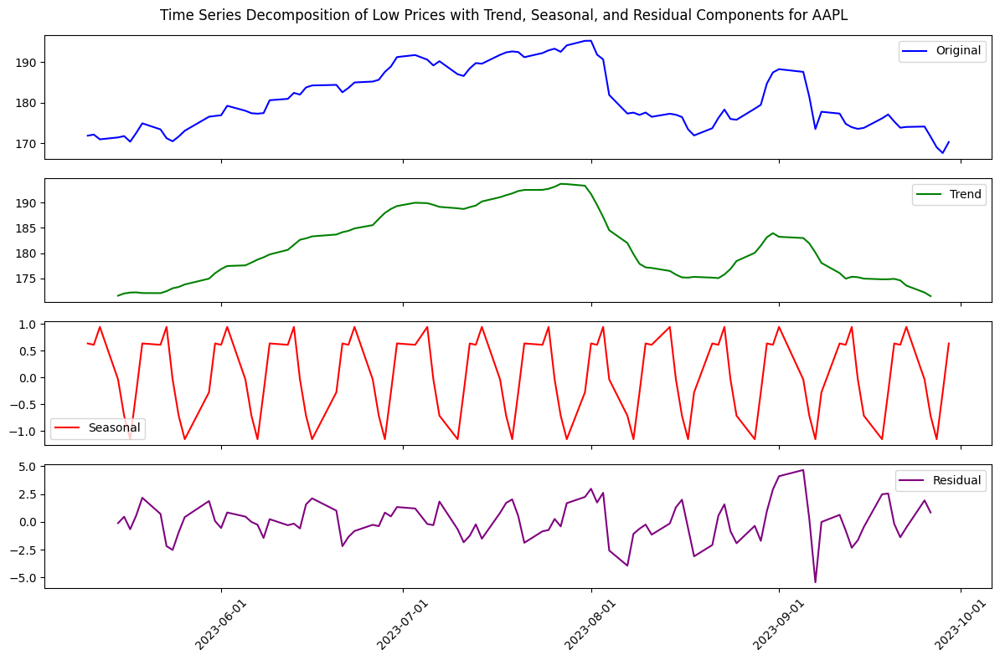

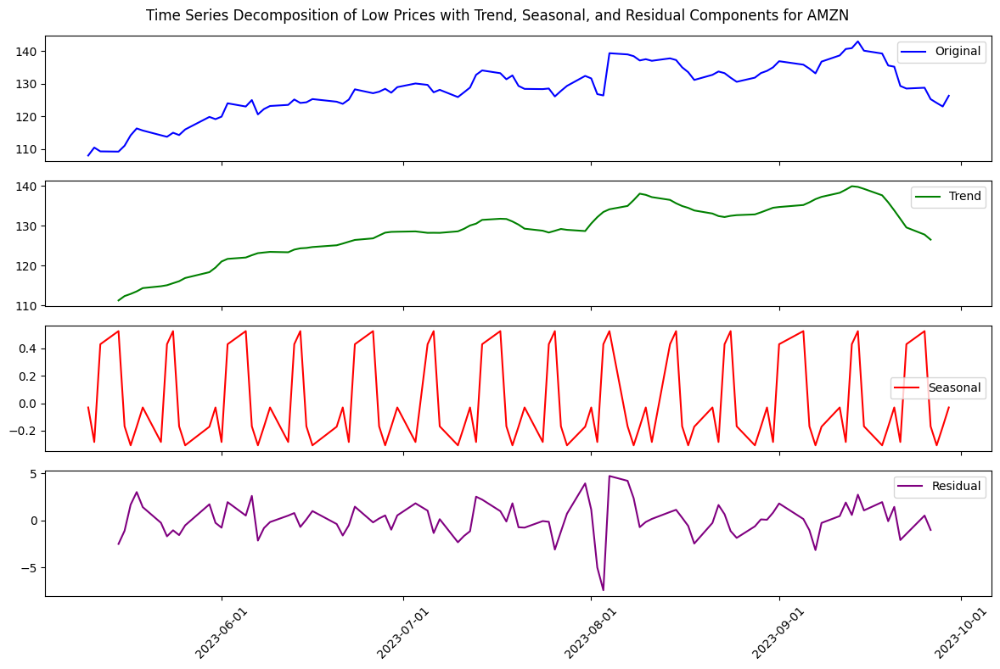

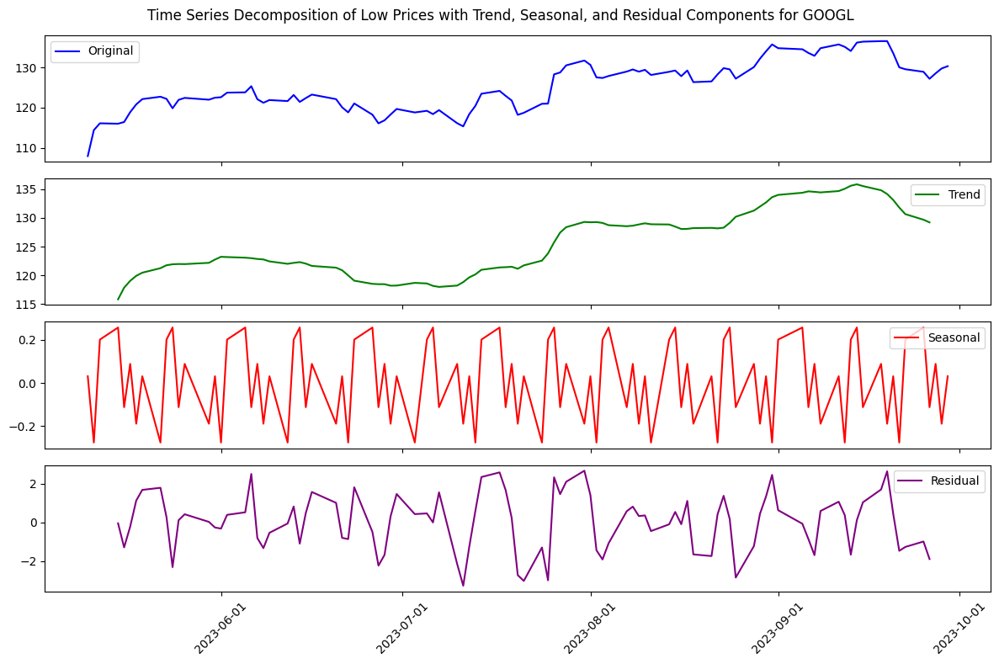

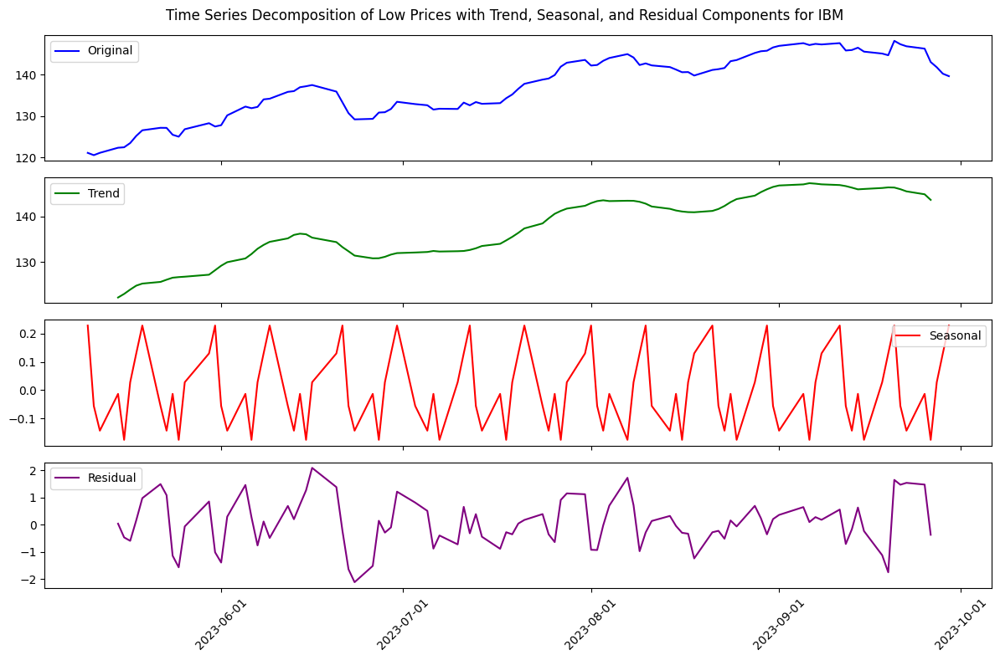

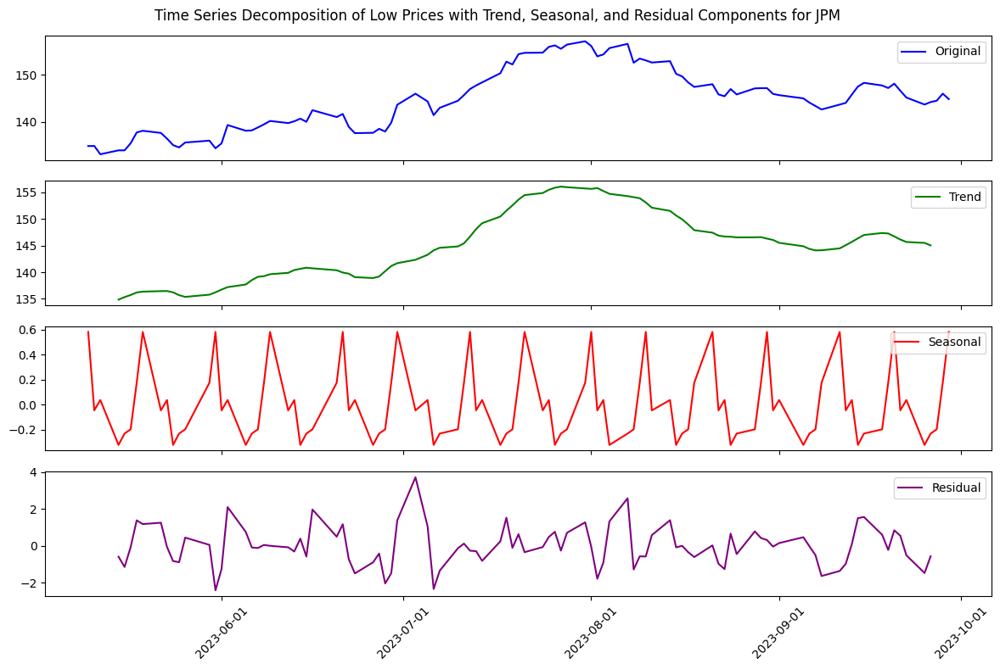

...

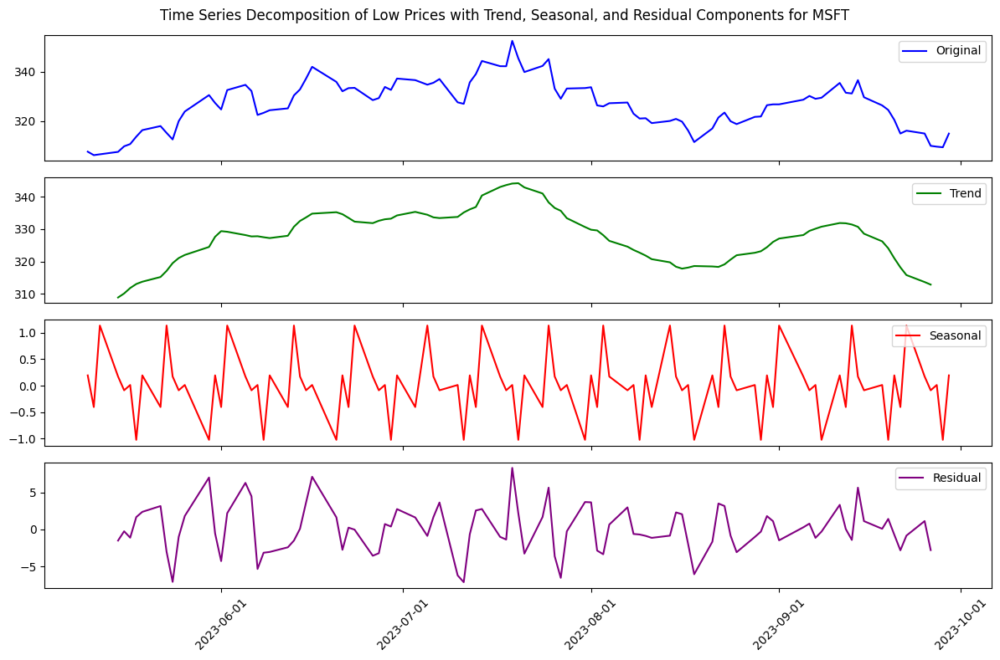

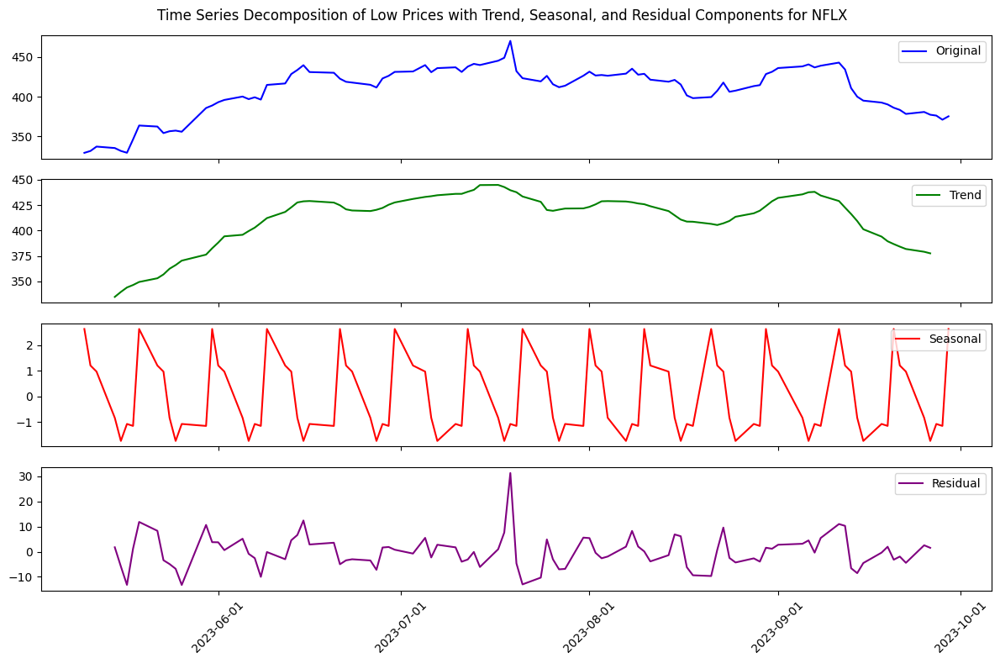

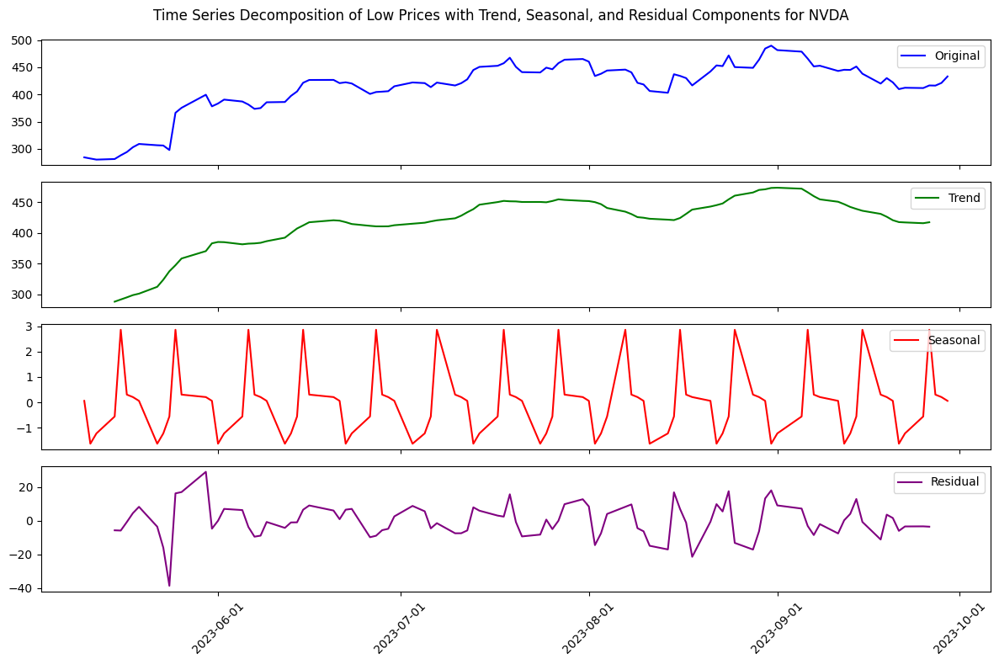

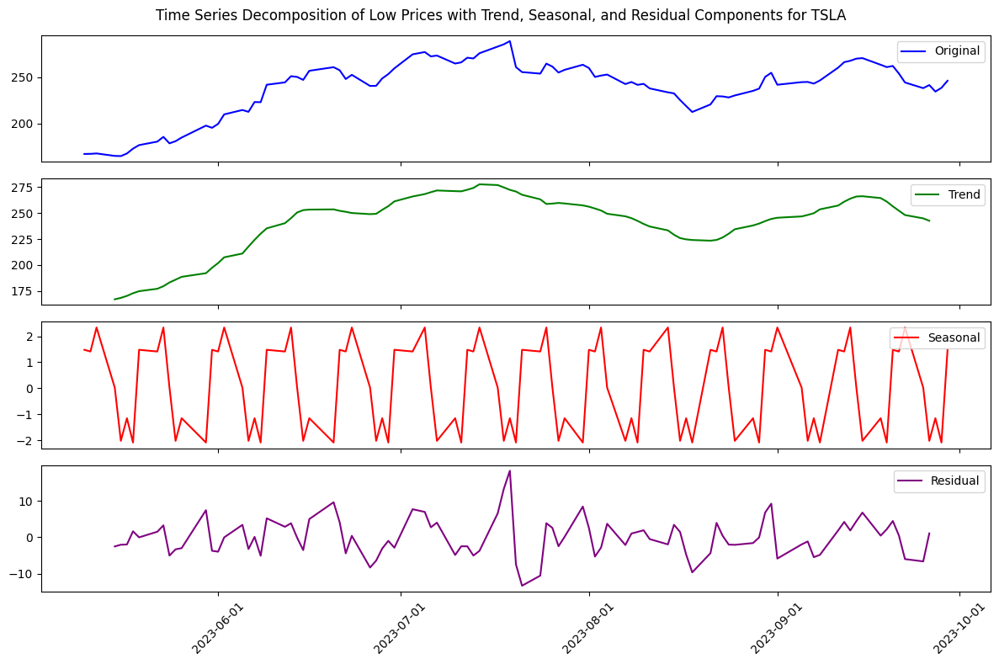

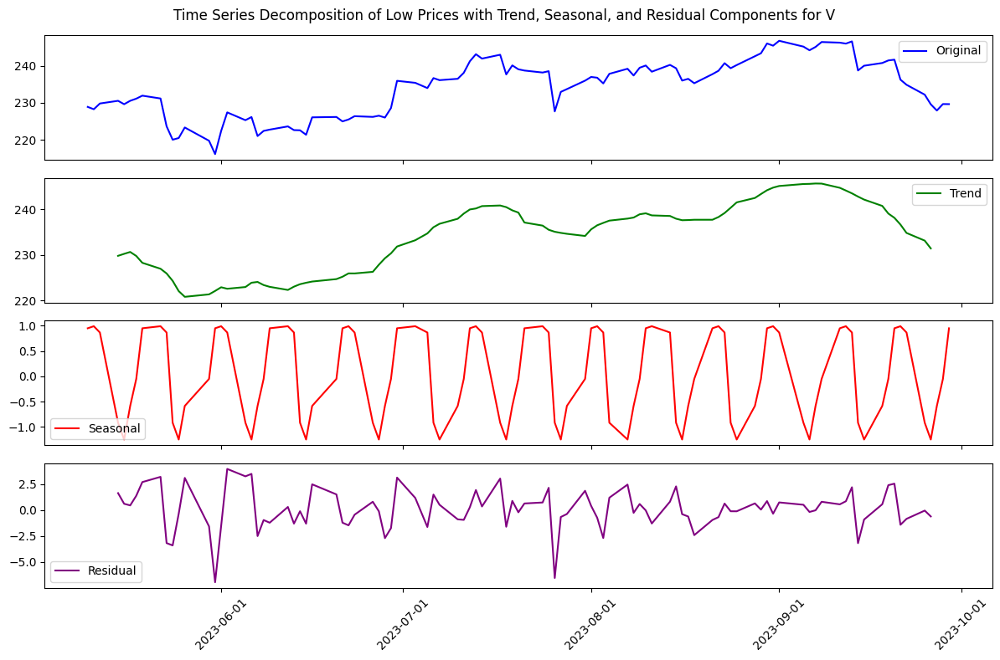

In [23]:
# Create a list of unique stock symbols in the DataFrame
stock_symbols = df_copy['symbol'].unique()

# Create a color map for each stock symbol (you can customize this)
colors = ['red', 'blue', 'green', 'purple', 'orange', 'brown', 'pink', 'gray', 'cyan', 'magenta', 'black']

# Loop through each stock symbol and create separate plots
for i, symbol in enumerate(stock_symbols):
    # Filter the DataFrame for the specific stock symbol
    stock_df = df_copy[df_copy['symbol'] == symbol]

    # Set the figure size and subplot layout
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 8), sharex=True)

    # Perform time series decomposition for the current stock's volume data
    decomposition = sm.tsa.seasonal_decompose(stock_df['low'], period=7)

    # Plot the original time series
    ax1.plot(stock_df.index, stock_df['low'], label='Original', color='blue')
    ax1.legend()

    # Plot the trend component
    ax2.plot(decomposition.trend, label='Trend', color='green')
    ax2.legend()

    # Plot the seasonal component
    ax3.plot(decomposition.seasonal, label='Seasonal', color='red')
    ax3.legend()

    # Plot the residual component
    ax4.plot(decomposition.resid, label='Residual', color='purple')
    ax4.legend()

    # Format the x-axis date labels on the last subplot and rotate them for readability
    ax4.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax4.tick_params(axis='x', rotation=45)

    # Set a title for the current stock's decomposition plot
    plt.suptitle(f"Time Series Decomposition of Low Prices with Trend, Seasonal, and Residual Components for {symbol}")

    # Adjust subplot layout
    plt.tight_layout()

    # Show the plot for the current stock symbol
    plt.show()

    # Close the current plot before proceeding to the next stock
    plt.close()